## Part 2: Network Analysis

In [245]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import seaborn as sns 

plt.style.use('ggplot') 
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [246]:
fraud = pd.read_csv('task2_customers_devices_cards.csv')
fraud.head()

,deviceId,devicetype,user_id,credit_card_id,domain
0,dev-a6ec70f1,NaN,id-52760576,card-f62c9e0f51,ddk.com
1,dev-42671881,Sony Ericsson ST15i (ST15i_1250-2612),id-22891520,card-ab9b2255e1,yahoo.com
2,dev-a6ec70f1,NaN,id-14748672,card-f62c9e0f51,dkdl.com
3,dev-52480977,samsung GT-N7100 (t03gxx),id-36466688,card-ab9b2255e1,yahoo.com
4,dev-a6ec70f1,NaN,id-18005504,card-f62c9e0f51,djdjs.com


In [247]:
fraud.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 564 entries, 0 to 563
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   deviceId        564 non-null    object
 1   devicetype      545 non-null    object
 2   user_id         564 non-null    object
 3   credit_card_id  564 non-null    object
 4   domain          564 non-null    object
dtypes: object(5)
memory usage: 22.2+ KB


In [248]:
fraud.deviceId.value_counts().sort_values(ascending = False).head(10)

dev-a6ec70f1    69
dev-351a17b3    39
dev-55936229    15
dev-8233d9ae    14
dev-3C03919B    11
dev-3f6bd887    11
dev-50449052    10
dev-04968363    10
dev-54892927     9
dev-53361161     9
Name: deviceId, dtype: int64

In [249]:
fraud.deviceId.value_counts().sort_values(ascending = False).tail(10)

dev-52409398    1
dev-15236739    1
dev-0765DB5B    1
dev-C024C145    1
dev-54B4A2D1    1
dev-54110338    1
dev-55898447    1
dev-E863D094    1
dev-52674375    1
dev-8953BB05    1
Name: deviceId, dtype: int64

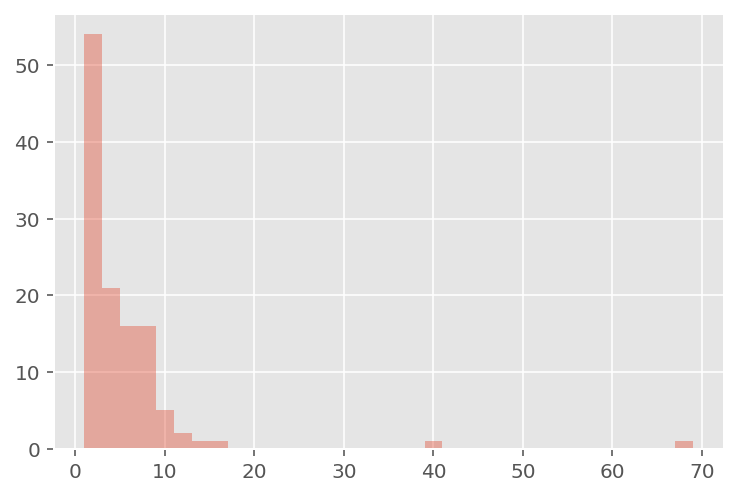

In [250]:
sns.distplot(pd.DataFrame(fraud.deviceId.value_counts()), kde = False)
plt.show()

Most devices are used only once. 

In [251]:
fraud.devicetype.value_counts()

ios                                          124
iPhone 5                                      65
iPhone 4                                      64
iPhone 4S                                     58
samsung GT-I9300 (m0xx)                       43
samsung GT-I9505 (jfltexx)                    28
iPhone 5S                                     22
samsung GT-N7100 (t03gxx)                     16
samsung GT-I9195 (serranoltexx)               15
samsung SM-G900F (kltexx)                     14
iPhone 5c                                     13
Sony C6603                                    10
Sony C6603 (C6603_1270-7689)                   9
samsung SM-N9005 (hltexx)                      8
samsung GT-S5570                               7
Sony Ericsson ST15i (ST15i_1250-2612)          7
samsung GT-I9100                               6
HTC HTC One mini 2 (o2_uk)                     4
iPhone 3GS                                     4
Sony LT30p                                     4
iPad4-1             

In [252]:
fraud.groupby('deviceId').devicetype.value_counts().head(25)

deviceId      devicetype                               
dev-0377CBC9  iPhone 5                                      3
dev-04968363  iPhone 5                                     10
dev-0765DB5B  iPhone 5                                      1
dev-077FAAAC  iPhone 4                                      5
dev-08806A70  iPhone 5                                      2
dev-0C6C6FBA  iPhone 4                                      2
dev-11A393EE  iPhone 4                                      6
dev-13063360  HUAWEI Ascend G300 (U8815)                    1
dev-14177216  samsung GT-I9300 (m0xx)                       8
dev-15236739  TCT ALCATEL ONE TOUCH 4010X (Beetle_Lite)     1
dev-16C1B335  iPhone 4S                                     3
dev-21047cb3  samsung GT-I9300 (m0xx)                       8
dev-24DE3063  iPad4-1                                       1
dev-26126FD1  iPhone 5S                                     8
dev-288277CE  iPhone 5S                                     1
dev-2E262B18  

In [253]:
def iphonetoios(row):
    if row.deviceId == 'dev-a6ec70f1':
        return 'ios'
    else:
        return row.devicetype

In [254]:
fraud['devicetype'] = fraud.apply(iphonetoios, axis =1)

In [255]:
fraud.devicetype.fillna('not available', inplace= True)

The device type does not change between devices.

In [256]:
fraud.user_id.value_counts().head(15)

id-492766      27
id-477055      14
id-16534528    12
id-87331584    11
id-03773440    11
id-84720128     9
id-75594752     9
id-26055680     8
id-61842176     8
id-53332992     8
id-76710400     8
id-26241536     8
id-14978304     8
id-56615424     8
id-02134016     8
Name: user_id, dtype: int64

In [257]:
fraud.user_id.value_counts().tail(15)

id-33183488    1
id-46380544    1
id-328819      1
id-44074496    1
id-47340032    1
id-38839808    1
id-12229632    1
id-33002752    1
id-03240704    1
id-08019456    1
id-63145728    1
id-28427776    1
id-33424640    1
id-72207104    1
id-92182272    1
Name: user_id, dtype: int64

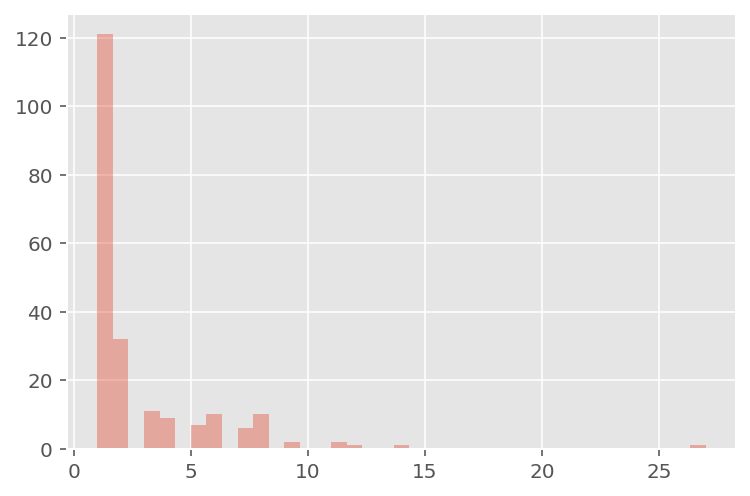

In [258]:
sns.distplot(pd.DataFrame(fraud.user_id.value_counts()), kde = False)
plt.show()

The number of times a user id occurs follows a similar right skewed distribution to deviceId. 

In [259]:
fraud.credit_card_id.value_counts().head(15)

card-f62c9e0f51    58
card-7fc1b208c8    30
card-719c600e76    25
card-ab9b2255e1    17
card-11c7ef16c7    13
card-1f990464c1     7
card-3fe74d61f8     6
card-b92a18916c     6
card-e4a5f8a41f     5
card-8cd889138a     5
card-735a7dfd5b     3
card-7c8e4b0275     3
card-8af0416be0     3
card-0ee7f3754b     3
card-fb6eb0fb1b     3
Name: credit_card_id, dtype: int64

In [260]:
fraud.credit_card_id.value_counts().tail(15)

card-66f55b55fe    1
card-80c6faf5ef    1
card-a51554c18c    1
card-309301f428    1
card-d02a55aff8    1
card-30510292cf    1
card-bc44515b2c    1
card-0c08bf2a2e    1
card-c84f9980b3    1
card-833c935622    1
card-a9c61bfee6    1
card-704fbb0430    1
card-6630f185b2    1
card-10ce137327    1
card-00887fab62    1
Name: credit_card_id, dtype: int64

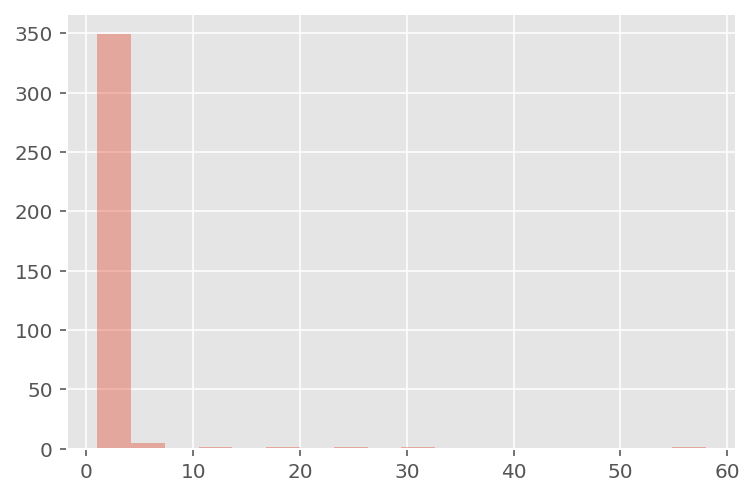

In [261]:
sns.distplot(pd.DataFrame(fraud.credit_card_id.value_counts()), kde = False)
plt.show()

The number of times a card is used is even more right skewed. 

In [262]:
fraud.groupby('user_id').credit_card_id.count().sort_values(ascending = False).head(15)

user_id
id-492766      27
id-477055      14
id-16534528    12
id-03773440    11
id-87331584    11
id-84720128     9
id-75594752     9
id-26241536     8
id-02134016     8
id-94461696     8
id-26055680     8
id-76710400     8
id-56615424     8
id-14978304     8
id-61842176     8
Name: credit_card_id, dtype: int64

When I group by the user_id, we begin to see that some users have registered a lot of different credit cards to their accoiunt, something that might be suspicious. 

In [263]:
fraud.domain.value_counts().head(20)

gmail.com         106
hotmail.com        82
yahoo.au           55
yahoo.com          43
mail.com           27
mailinator.com     19
outlook.com        16
aol.com             9
yahoo.co.uk         9
yahoo.ir            8
betfair.com         7
ymail.com           7
mail.dcu.au         7
dkdk.com            6
gij.com             5
hij.com             5
yahoo.com.cn        5
au.ibm.com          5
hotmaik.com         4
rabobank.com        4
Name: domain, dtype: int64

The first 11 of these look like legitimate email domains, after this they begin to look suspicious. Some look made up, for example 'dkdk.com', 'gij.com' or 'hij.com' and others are misspelt 'ymail.com', 'hotmaik.com'. 

Taking a further look into one of the devices that was used many times we can see that this device appears with two different user_id and used 12 unique credit cards. 

In [264]:
fraud[fraud.deviceId == 'dev-55936229'].head(15)

,deviceId,devicetype,user_id,credit_card_id,domain
192,dev-55936229,samsung GT-I9195 (serranoltexx),id-03842048,card-1df1b74fe6,live.au
194,dev-55936229,samsung GT-I9195 (serranoltexx),id-03842048,card-6a00c620d5,live.au
195,dev-55936229,samsung GT-I9195 (serranoltexx),id-03842048,card-1adc409a1c,live.au
197,dev-55936229,samsung GT-I9195 (serranoltexx),id-03842048,card-428afad22d,live.au
533,dev-55936229,samsung GT-I9195 (serranoltexx),id-87331584,card-c075a141cd,yahoo.au
534,dev-55936229,samsung GT-I9195 (serranoltexx),id-87331584,card-6a00c620d5,yahoo.au
535,dev-55936229,samsung GT-I9195 (serranoltexx),id-87331584,card-d97d8e6681,yahoo.au
536,dev-55936229,samsung GT-I9195 (serranoltexx),id-87331584,card-322bd4cacc,yahoo.au
537,dev-55936229,samsung GT-I9195 (serranoltexx),id-87331584,card-f7f3fad9b4,yahoo.au
540,dev-55936229,samsung GT-I9195 (serranoltexx),id-87331584,card-1adc409a1c,yahoo.au


In [265]:
fraud[fraud.deviceId == 'dev-55936229'].user_id.value_counts()

id-87331584    11
id-03842048     4
Name: user_id, dtype: int64

In [266]:
fraud[fraud.deviceId == 'dev-55936229'].credit_card_id.value_counts()

card-6a00c620d5    2
card-428afad22d    2
card-1adc409a1c    2
card-fa860e20a4    1
card-d97d8e6681    1
card-c075a141cd    1
card-322bd4cacc    1
card-1df1b74fe6    1
card-f7f3fad9b4    1
card-52736f2516    1
card-ed838643f8    1
card-38d27cf33d    1
Name: credit_card_id, dtype: int64

In [267]:
fraud[(fraud.credit_card_id == 'card-c075a141cd')]

,deviceId,devicetype,user_id,credit_card_id,domain
533,dev-55936229,samsung GT-I9195 (serranoltexx),id-87331584,card-c075a141cd,yahoo.au


In [328]:
fraud.groupby('user_id').domain.describe().sort_values(by = 'unique', ascending = False)

,count,unique,top,freq
user_id,,,,
id-00448256,2,1,cikk.com,2
id-53962240,1,1,fdi.com,1
id-54021120,5,1,gmail.com,5
id-55638528,1,1,yuu.com,1
id-55651584,1,1,hoo.com,1
...,...,...,...,...
id-33183488,1,1,hdjdh.com,1
id-33424640,1,1,utt.com,1
id-33634304,1,1,fii.com,1


## Visualising the networks

In [268]:
fraud.head()

,deviceId,devicetype,user_id,credit_card_id,domain
0,dev-a6ec70f1,ios,id-52760576,card-f62c9e0f51,ddk.com
1,dev-42671881,Sony Ericsson ST15i (ST15i_1250-2612),id-22891520,card-ab9b2255e1,yahoo.com
2,dev-a6ec70f1,ios,id-14748672,card-f62c9e0f51,dkdl.com
3,dev-52480977,samsung GT-N7100 (t03gxx),id-36466688,card-ab9b2255e1,yahoo.com
4,dev-a6ec70f1,ios,id-18005504,card-f62c9e0f51,djdjs.com


Let's start by using deviceID, user_id and credit_card_id as nodes.

In [334]:
F = nx.Graph()

In [335]:
devices_df = pd.DataFrame()
devices_df['devices'] = list(zip(fraud.deviceId, fraud.devicetype))

In [336]:
devices_df.devices.value_counts().head()

(dev-a6ec70f1, ios)                                69
(dev-351a17b3, ios)                                39
(dev-55936229, samsung GT-I9195 (serranoltexx))    15
(dev-8233d9ae, ios)                                14
(dev-3C03919B, iPhone 4)                           11
Name: devices, dtype: int64

In [337]:
devices_df.iloc[1][0][1]

'Sony Ericsson ST15i (ST15i_1250-2612)'

In [338]:
for row in devices_df.devices:
    F.add_node(row[0], devicetype =row[1])

In [340]:
F.nodes['dev-a6ec70f1']

{'devicetype': 'ios'}

In [341]:
account_domain_df = pd.DataFrame()
account_domain_df['domains'] = list(zip(fraud.user_id, fraud.domain))

In [342]:
account_domain_df.domains.value_counts().head()

(id-492766, mail.com)            27
(id-477055, yahoo.au)            14
(id-16534528, mailinator.com)    12
(id-87331584, yahoo.au)          11
(id-03773440, yahoo.au)          11
Name: domains, dtype: int64

In [343]:
for row in account_domain_df.domains:
    F.add_node(row[0], domain = row[1])

In [351]:
F.add_edges_from([tuple(row) for row in fraud[['deviceId', 'user_id']].values])
F.add_edges_from([tuple(row) for row in fraud[['deviceId', 'credit_card_id']].values])
F.add_edges_from([tuple(row) for row in fraud[['user_id', 'credit_card_id']].values])

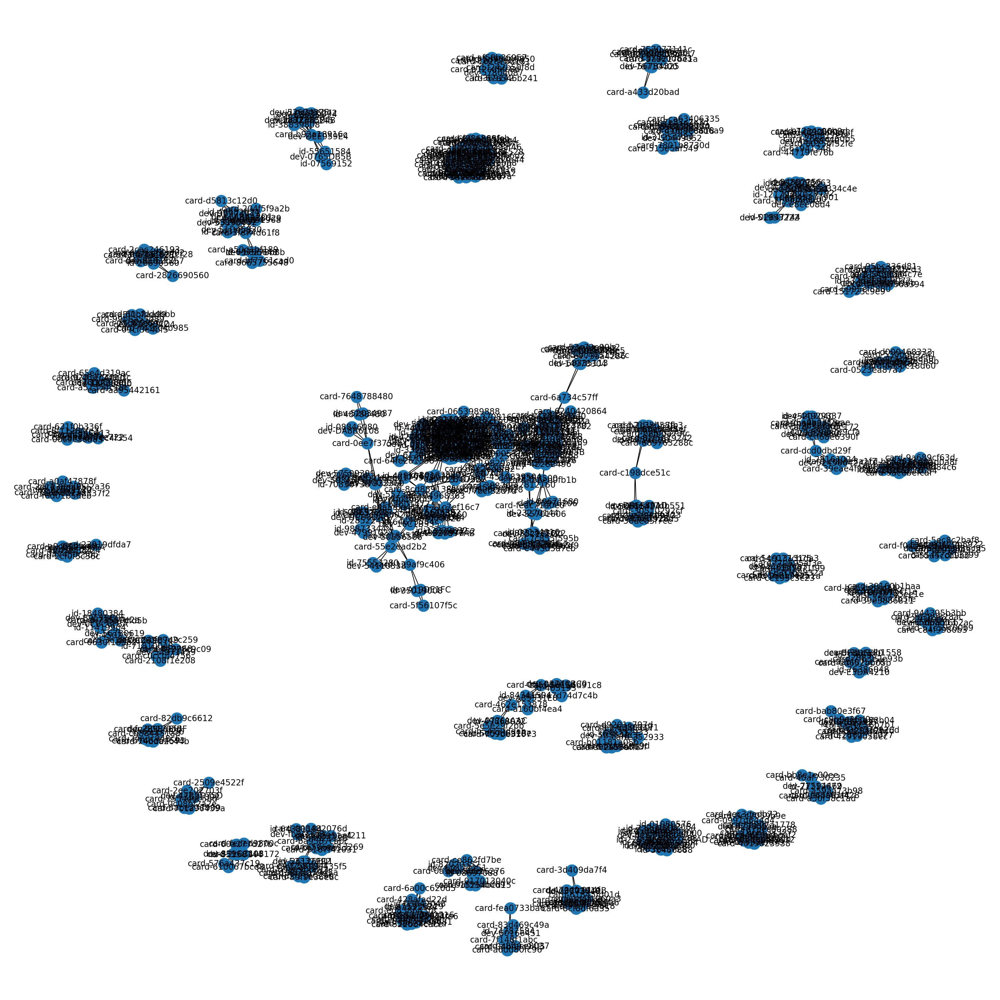

In [426]:
plt.figure(figsize = (20,20))
nx.draw(F, with_labels = True)
plt.savefig('graph1_labels.png')
plt.show()

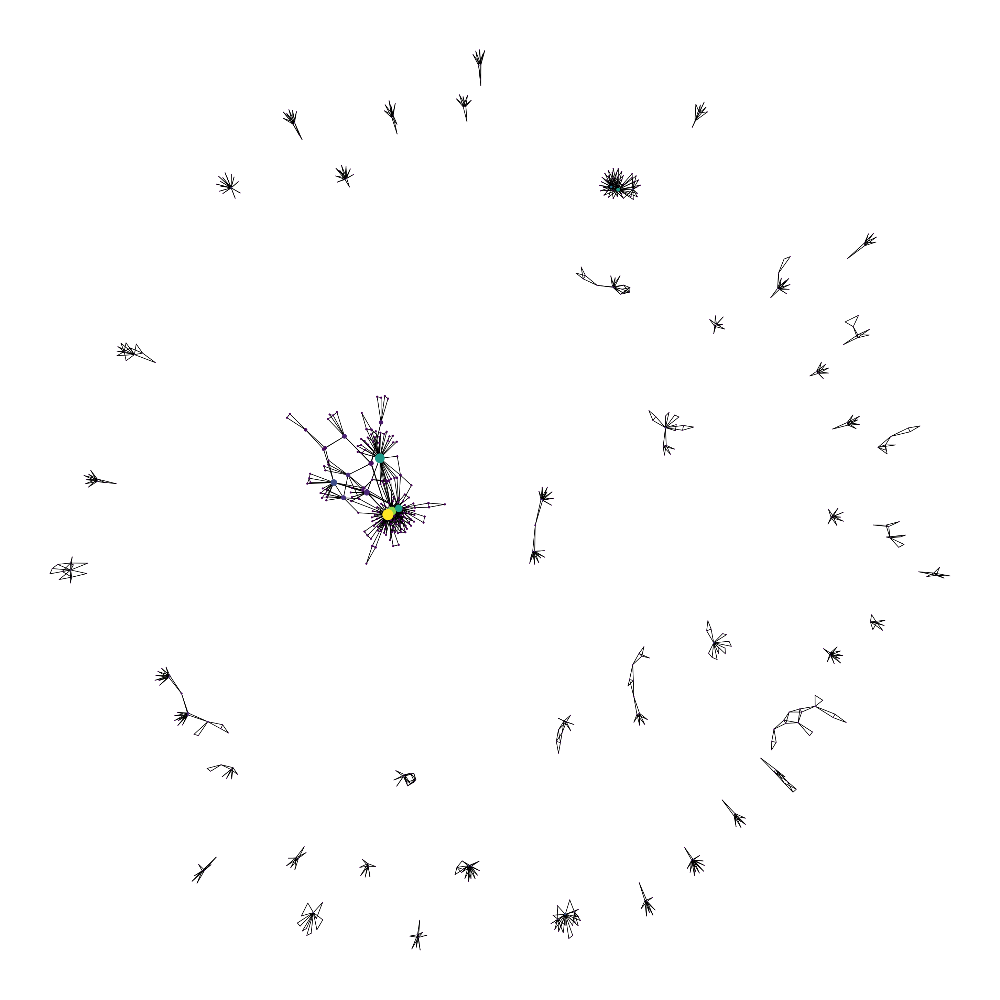

In [427]:
pos = nx.spring_layout(F)
betCent = nx.betweenness_centrality(F, normalized=True, endpoints=True)
node_color = [20000.0 * F.degree(v) for v in F]
node_size =  [v * 10000 for v in betCent.values()]
plt.figure(figsize=(20,20))
nx.draw(F, pos=pos, with_labels=False,
                 node_color=node_color,
                 node_size=node_size )

plt.savefig('graph1_no_labels_skeleton.png')
plt.show()



In [364]:
sub_graphsF = (F.subgraph(c) for c in nx.connected_components(F))
for i, sg in enumerate(sub_graphsF):
    print ("subgraph {} has {} nodes, {} edges".format(i, sg.number_of_nodes(), sg.number_of_edges()))
    #print ("\tNodes:", sg.nodes(data=True))
    #print ("\tEdges:", sg.edges())

subgraph 0 has 162 nodes, 326 edges
subgraph 1 has 21 nodes, 37 edges
subgraph 2 has 15 nodes, 22 edges
subgraph 3 has 18 nodes, 28 edges
subgraph 4 has 11 nodes, 19 edges
subgraph 5 has 10 nodes, 17 edges
subgraph 6 has 7 nodes, 11 edges
subgraph 7 has 8 nodes, 13 edges
subgraph 8 has 24 nodes, 42 edges
subgraph 9 has 18 nodes, 30 edges
subgraph 10 has 8 nodes, 13 edges
subgraph 11 has 11 nodes, 20 edges
subgraph 12 has 13 nodes, 23 edges
subgraph 13 has 9 nodes, 15 edges
subgraph 14 has 8 nodes, 13 edges
subgraph 15 has 10 nodes, 17 edges
subgraph 16 has 8 nodes, 12 edges
subgraph 17 has 41 nodes, 79 edges
subgraph 18 has 13 nodes, 18 edges
subgraph 19 has 12 nodes, 20 edges
subgraph 20 has 15 nodes, 29 edges
subgraph 21 has 15 nodes, 25 edges
subgraph 22 has 9 nodes, 15 edges
subgraph 23 has 10 nodes, 15 edges
subgraph 24 has 8 nodes, 13 edges
subgraph 25 has 8 nodes, 13 edges
subgraph 26 has 16 nodes, 29 edges
subgraph 27 has 8 nodes, 14 edges
subgraph 28 has 10 nodes, 17 edges
sub

In [365]:
sub_listF = [F.subgraph(c) for c in nx.connected_components(F)]

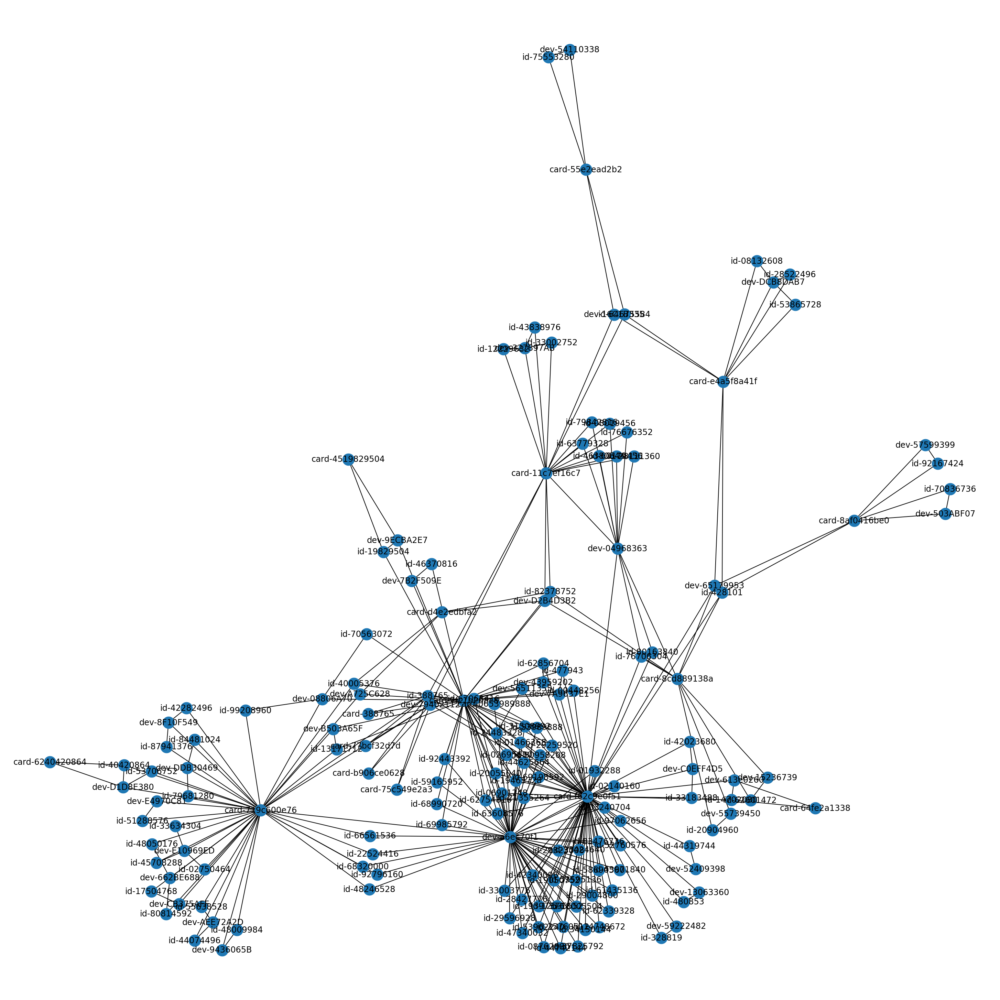

In [428]:
plt.figure(figsize = (20,20))
nx.draw(sub_listF[0], with_labels = True)
plt.savefig('subgraph0.png')
plt.show()

In [414]:
def get_centrality_df(graph):
    centrality = nx.eigenvector_centrality(graph)
    cent_dict_cust = {'node':[],'centrality':[]}
    for node, c in zip(centrality.keys(), centrality.values()):
        cent_dict_cust['node'].append(node)
        cent_dict_cust['centrality'].append(c)
    cent_df = pd.DataFrame(cent_dict_cust)
    cent_df['degree'] = cent_df.node.apply(lambda x: graph.degree(x))
    return cent_df


In [416]:
node_F0_df = get_centrality_df(sub_listF[0])

In [417]:
node_F0_df.sort_values(by= 'centrality', ascending = False).head(10)

,node,centrality,degree
122,card-f62c9e0f51,0.483797,70
44,dev-a6ec70f1,0.448848,58
155,card-7fc1b208c8,0.276521,41
111,card-719c600e76,0.113264,39
92,id-53989888,0.106697,4
69,id-02695680,0.102690,3
129,id-63608576,0.102690,3
45,id-31508992,0.102690,3
126,id-19465728,0.102690,3
22,id-20055040,0.102690,3


In [418]:
node_F0_df.sort_values(by = 'degree', ascending = False).head(10)

,node,centrality,degree
122,card-f62c9e0f51,0.483797,70
44,dev-a6ec70f1,0.448848,58
155,card-7fc1b208c8,0.276521,41
111,card-719c600e76,0.113264,39
128,card-11c7ef16c7,0.031876,18
5,dev-04968363,0.058330,12
57,card-8cd889138a,0.023465,10
108,id-388765,0.089688,9
119,dev-79402112,0.089688,9
48,card-e4a5f8a41f,0.009242,8


In [413]:
print('number of devices in this network: ', len(node_F0_df[node_F0_df.node.str.contains('dev')]))
print('number of user_id in this network: ', len(node_F0_df[node_F0_df.node.str.contains('id')]))
print('number of cards in this network: ', len(node_F0_df[node_F0_df.node.str.contains('card')]))

number of devices in this network:  35
number of user_id in this network:  110
number of cards in this network:  17


In [435]:
len(fraud[fraud.credit_card_id == 'card-f62c9e0f51'].deviceId.value_counts())

12

In [436]:
len(fraud[fraud.credit_card_id == 'card-f62c9e0f51'].user_id.value_counts())

58

In [430]:
fraud[fraud.deviceId == 'dev-a6ec70f1'].credit_card_id.value_counts()

card-f62c9e0f51    44
card-7fc1b208c8    19
card-719c600e76     5
card-0653989888     1
Name: credit_card_id, dtype: int64

In [499]:
fraud[fraud.deviceId == 'dev-a6ec70f1'].head()

,deviceId,devicetype,user_id,credit_card_id,domain
0,dev-a6ec70f1,ios,id-52760576,card-f62c9e0f51,ddk.com
2,dev-a6ec70f1,ios,id-14748672,card-f62c9e0f51,dkdl.com
4,dev-a6ec70f1,ios,id-18005504,card-f62c9e0f51,djdjs.com
6,dev-a6ec70f1,ios,id-83476736,card-f62c9e0f51,gio.com
7,dev-a6ec70f1,ios,id-29596928,card-f62c9e0f51,jdjd.com


In [439]:
sub_listF[1].nodes

NodeView(('id-92182272', 'id-28541952', 'id-75112960', 'card-ab9b2255e1', 'id-72207104', 'dev-52480977', 'id-63145728', 'id-90508032', 'id-84802304', 'dev-48273BAD', 'id-50222848', 'dev-42671881', 'id-10712064', 'id-22891520', 'id-36466688', 'id-94555136', 'id-74207488', 'id-41136384', 'id-53024000', 'id-24588800', 'id-01080576'))

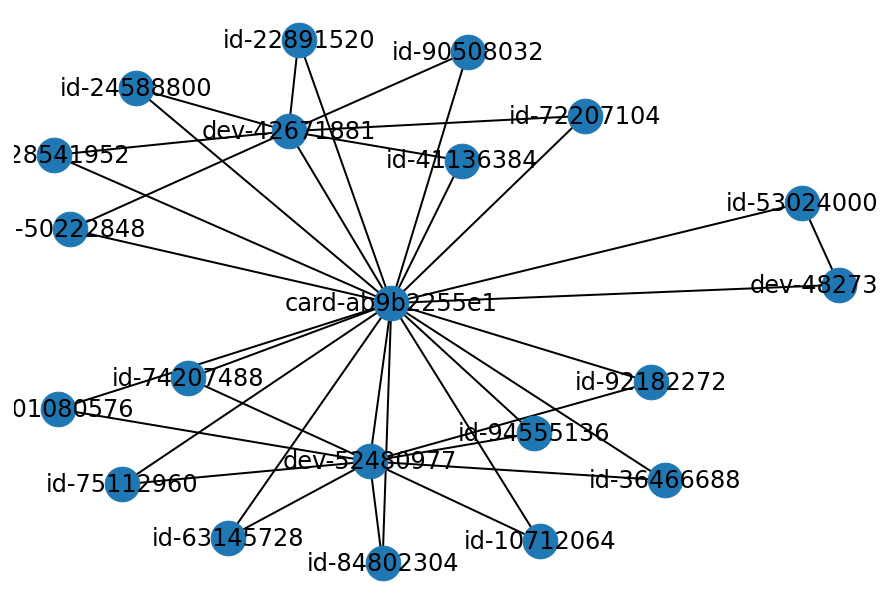

In [501]:
nx.draw(sub_listF[1], with_labels = True)
plt.savefig('subgraph01.png')

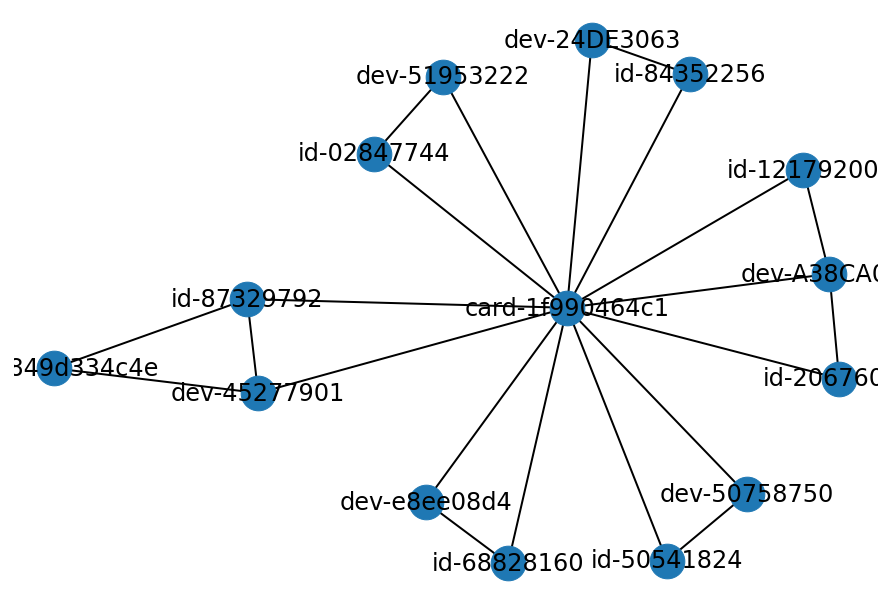

In [442]:
nx.draw(sub_listF[2], with_labels = True)

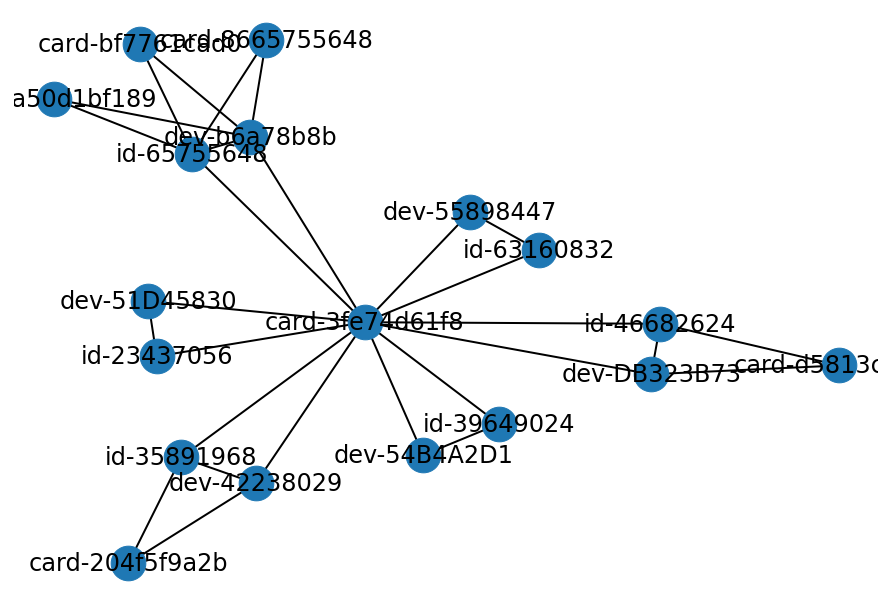

In [443]:
nx.draw(sub_listF[3], with_labels = True)

{'domain': 'aol.com'}
{'devicetype': 'Sony C6603 (C6603_1270-7689)'}


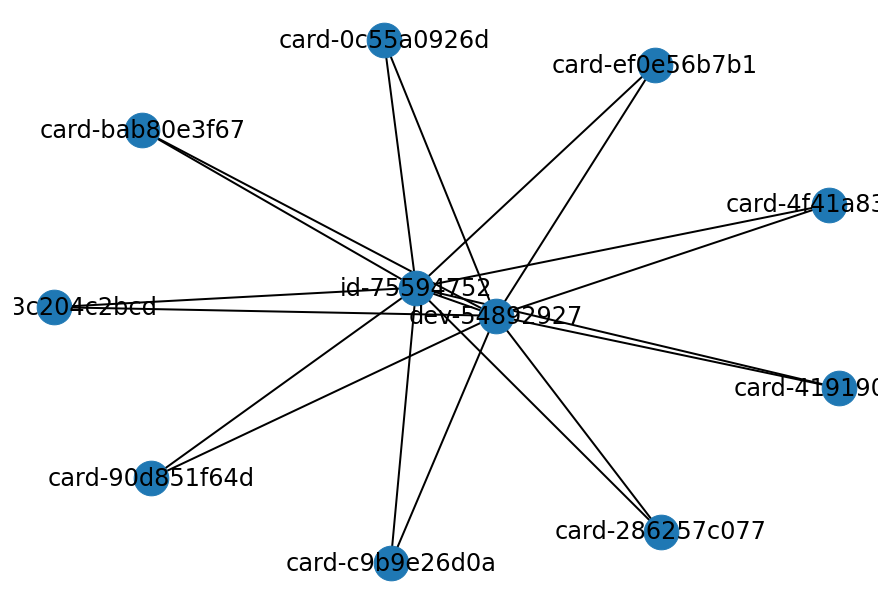

In [521]:
nx.draw(sub_listF[4], with_labels = True)
print(sub_listF[4].nodes['id-75594752'])
print(sub_listF[4].nodes['dev-54892927'])

{'domain': 'gmail.com'}
{'devicetype': 'samsung GT-I9300 (m0xx)'}


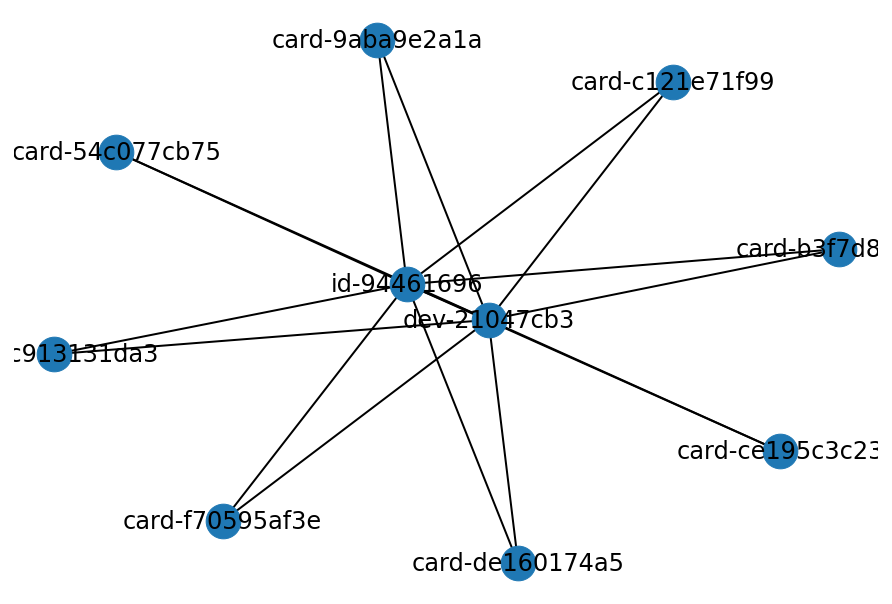

In [522]:
nx.draw(sub_listF[5], with_labels = True)
print(sub_listF[5].nodes['id-94461696'])
print(sub_listF[5].nodes['dev-21047cb3'])

{'domain': 'au.ibm.com'}
{'devicetype': 'samsung GT-I9505 (jfltexx)'}


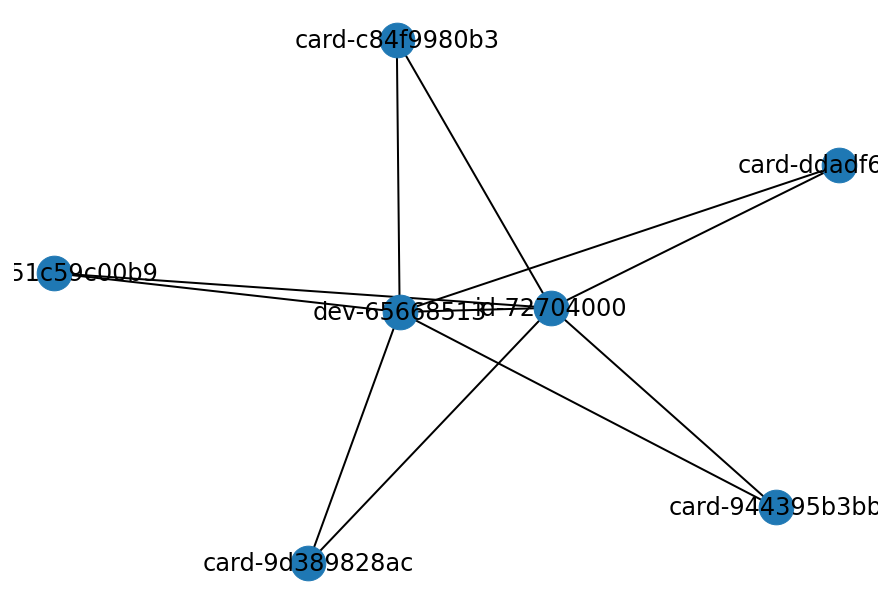

In [520]:
nx.draw(sub_listF[6], with_labels = True)
print(sub_listF[6].nodes['id-72704000'])
print(sub_listF[6].nodes['dev-65668513'])

In [509]:
print(sub_listF[6].nodes['id-72704000'])
print(sub_listF[6].nodes['dev-65668513'])

{'domain': 'au.ibm.com'}
{'devicetype': 'samsung GT-I9505 (jfltexx)'}


{'domain': 'yahoo.au'}
{'devicetype': 'samsung GT-N7100 (t03gxx)'}


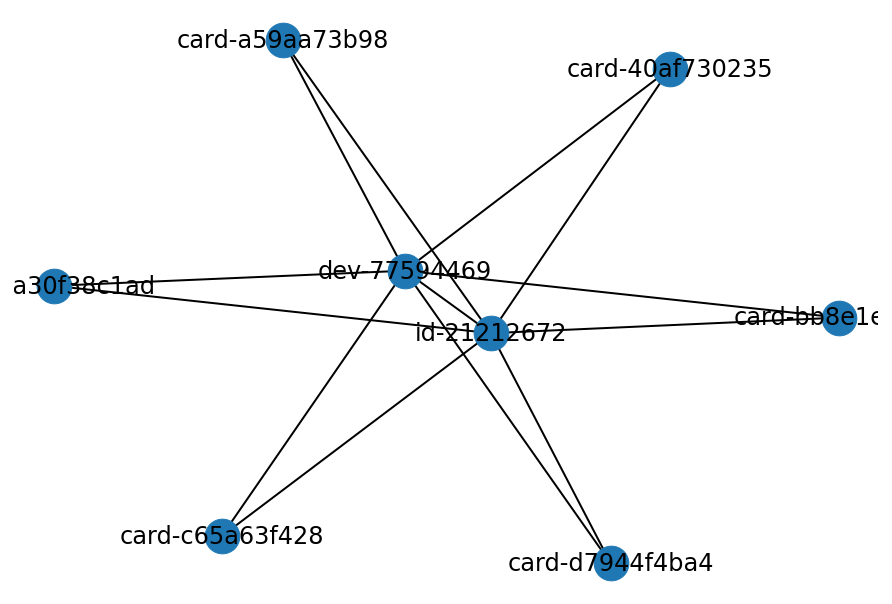

In [510]:
nx.draw(sub_listF[7], with_labels = True)
print(sub_listF[7].nodes['id-21212672'])
print(sub_listF[7].nodes['dev-77594469'])

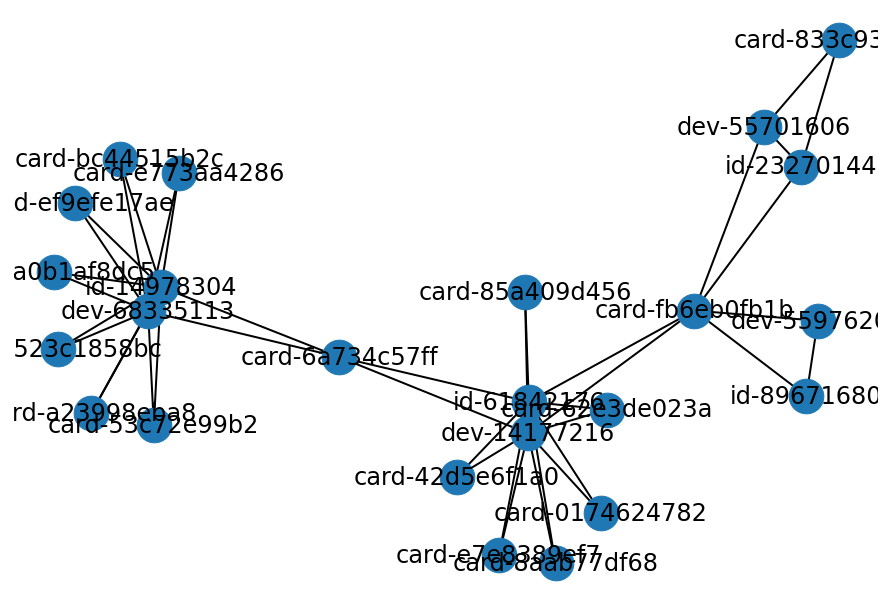

In [448]:
nx.draw(sub_listF[8], with_labels = True)

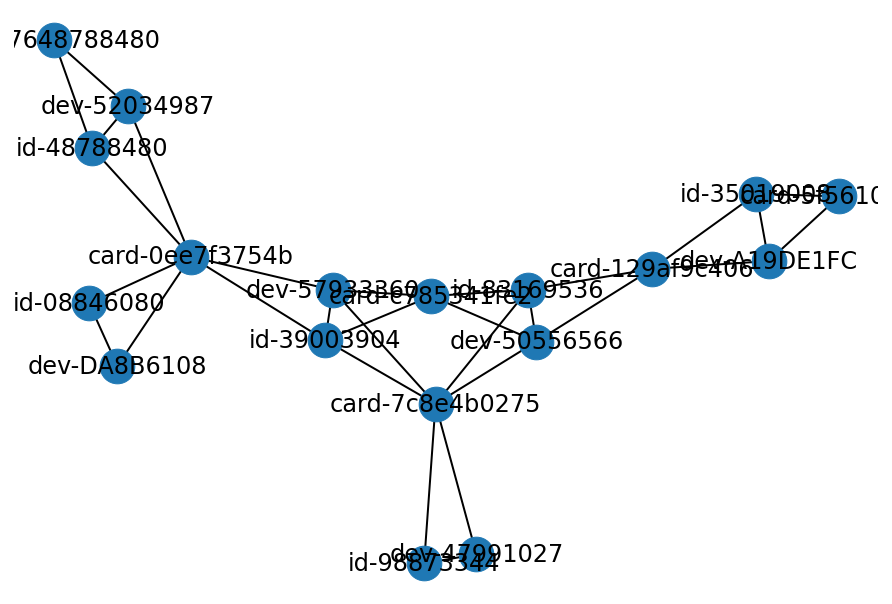

In [449]:
nx.draw(sub_listF[9], with_labels = True)

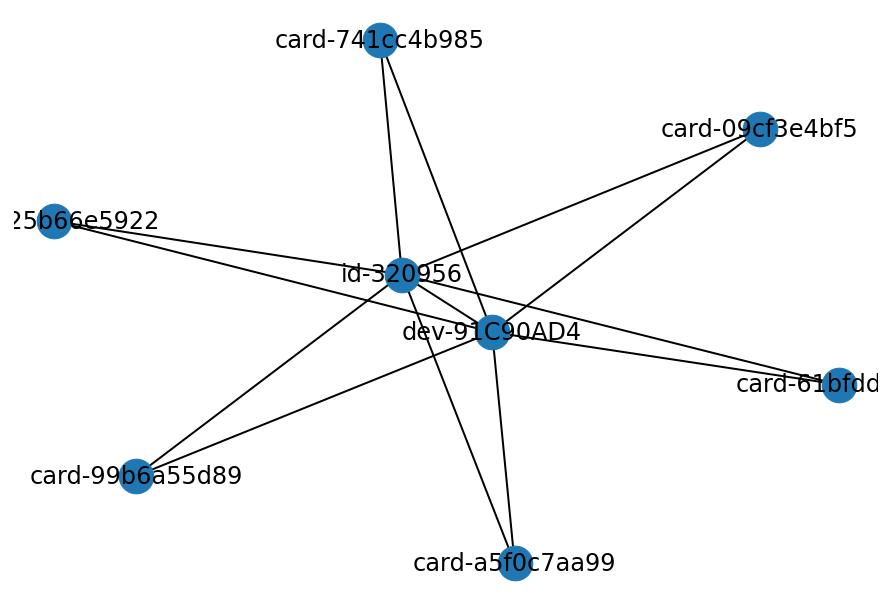

In [450]:
nx.draw(sub_listF[10], with_labels = True)

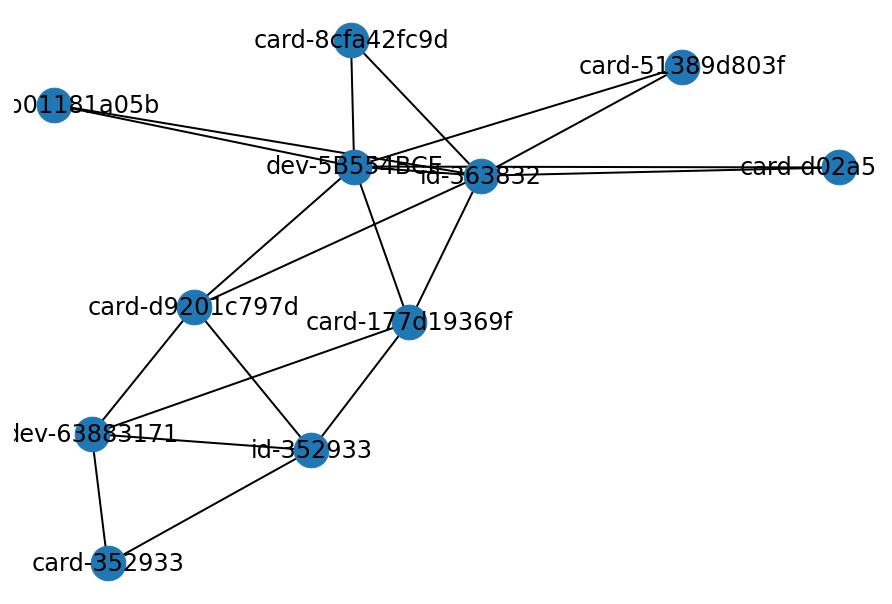

In [451]:
nx.draw(sub_listF[11], with_labels = True)

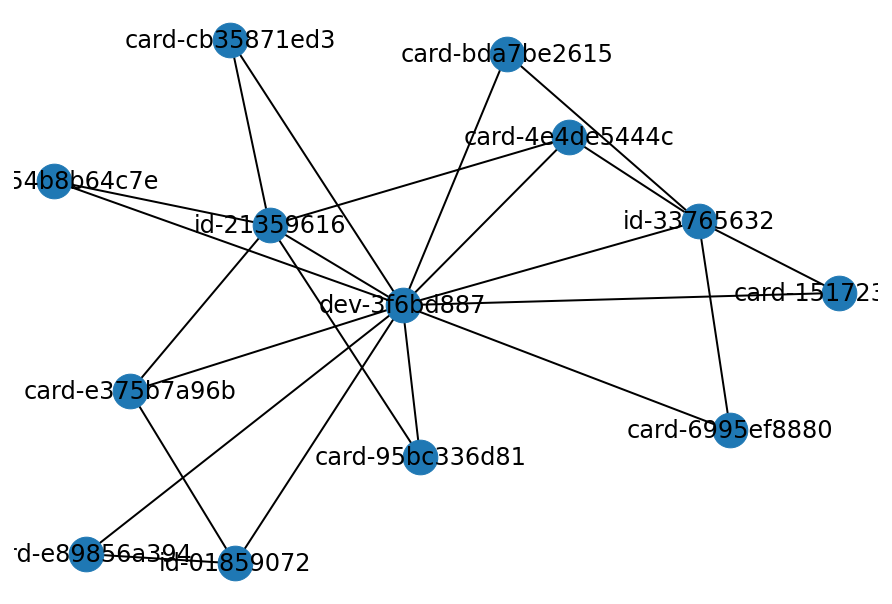

In [452]:
nx.draw(sub_listF[12], with_labels = True)

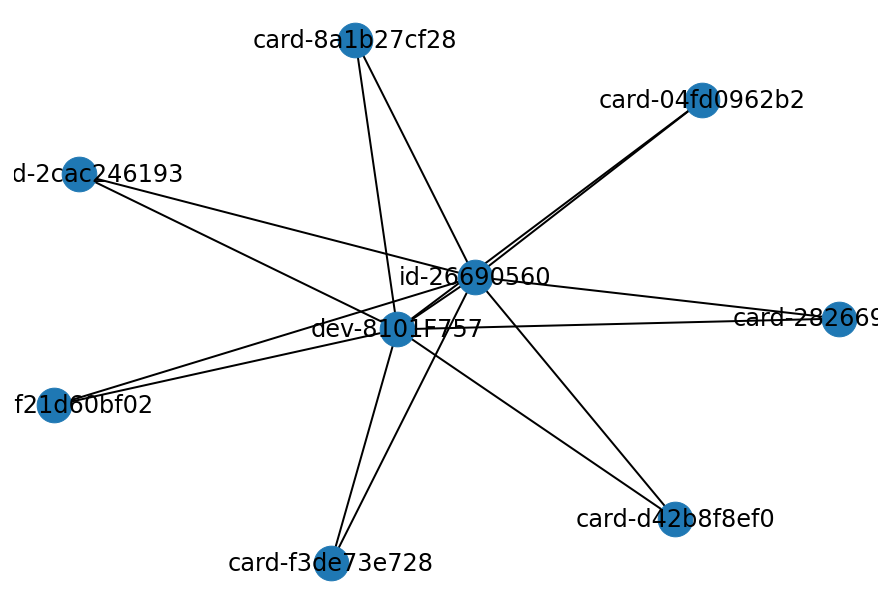

In [453]:
nx.draw(sub_listF[13], with_labels = True)

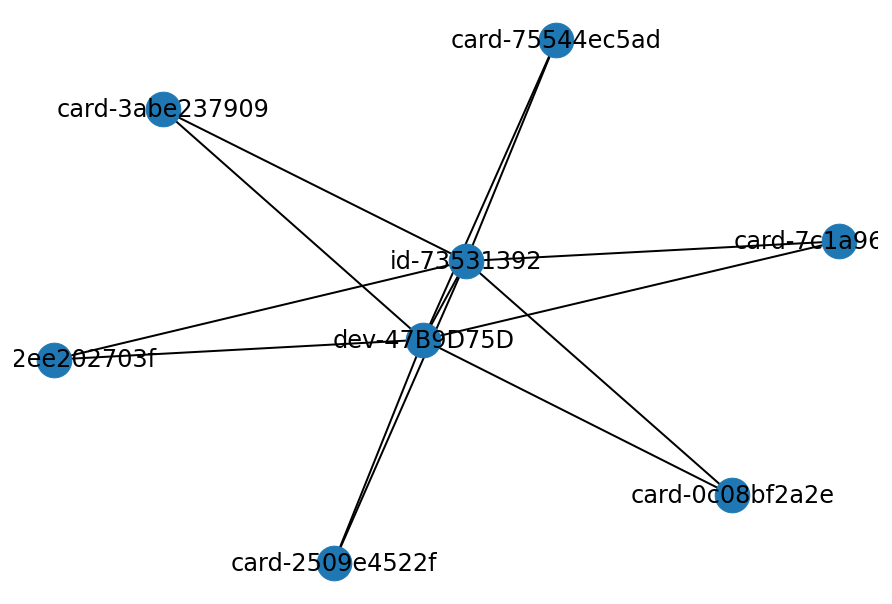

In [454]:
nx.draw(sub_listF[14], with_labels = True)

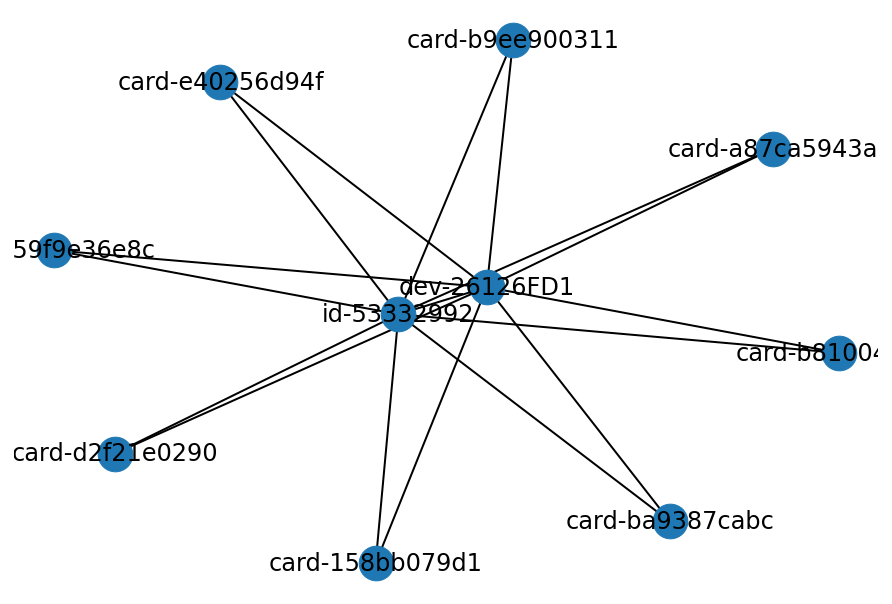

In [455]:
nx.draw(sub_listF[15], with_labels = True)

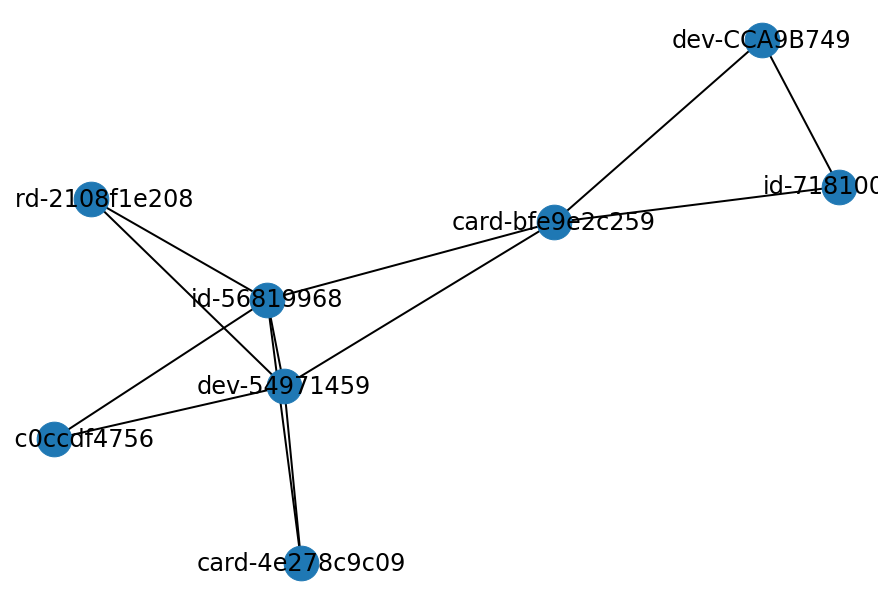

In [456]:
nx.draw(sub_listF[16], with_labels = True)

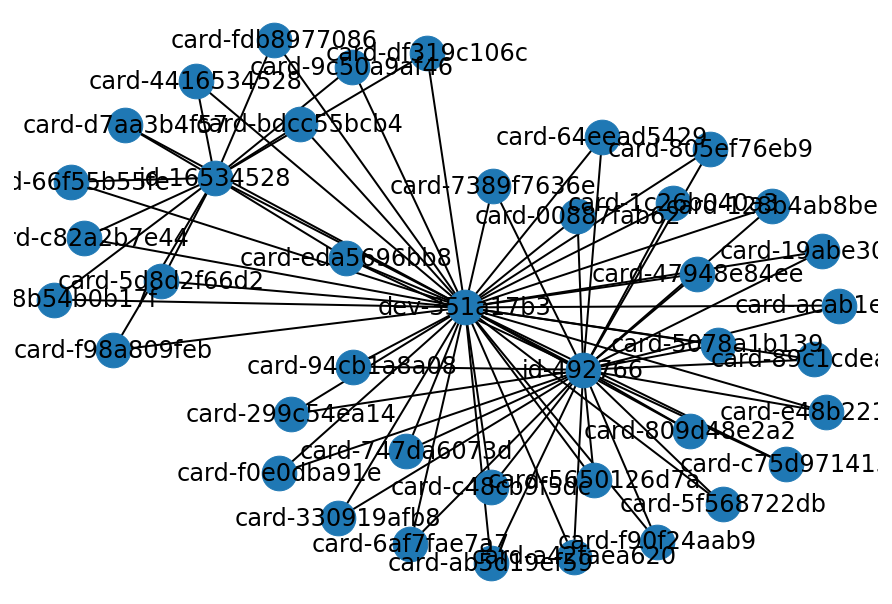

In [457]:
nx.draw(sub_listF[17], with_labels = True)

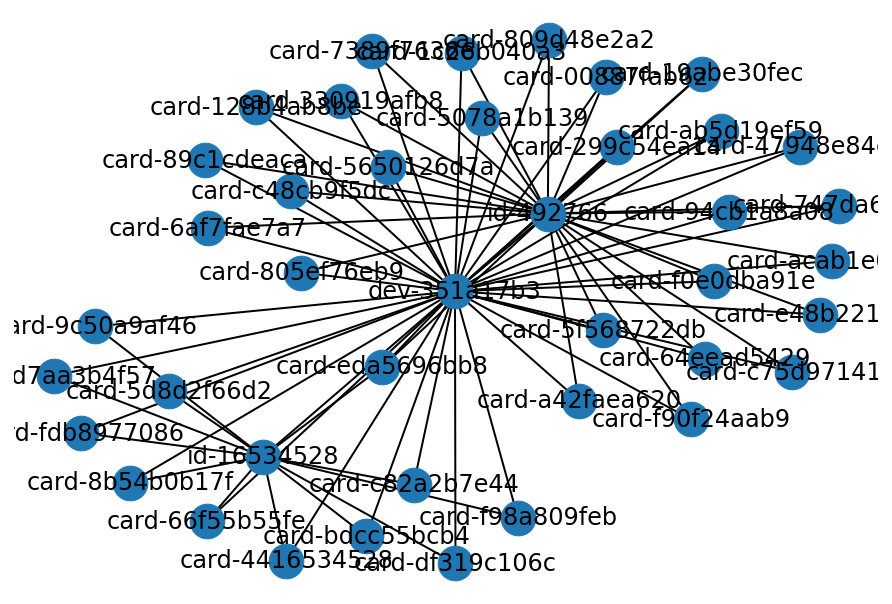

In [458]:
nx.draw(sub_listF[17], with_labels = True)

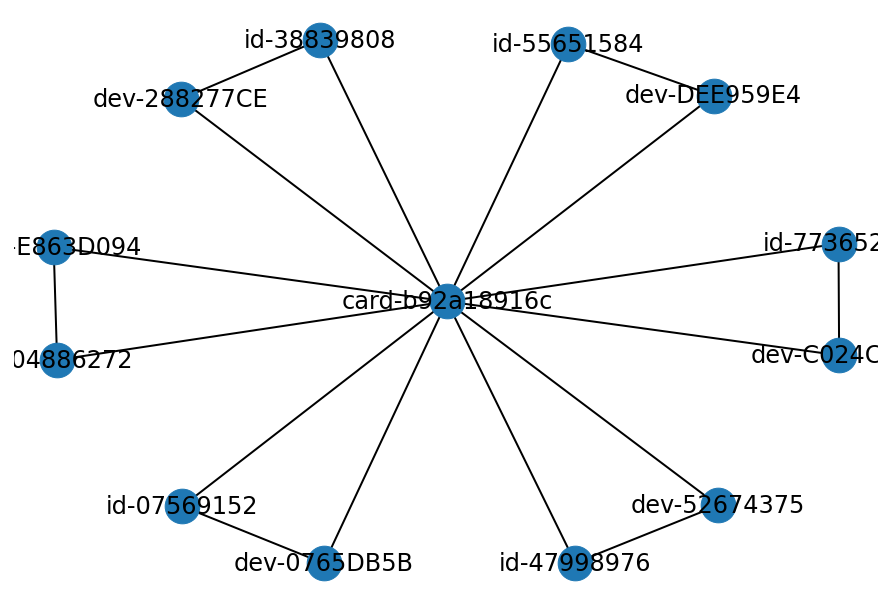

In [459]:
nx.draw(sub_listF[18], with_labels = True)

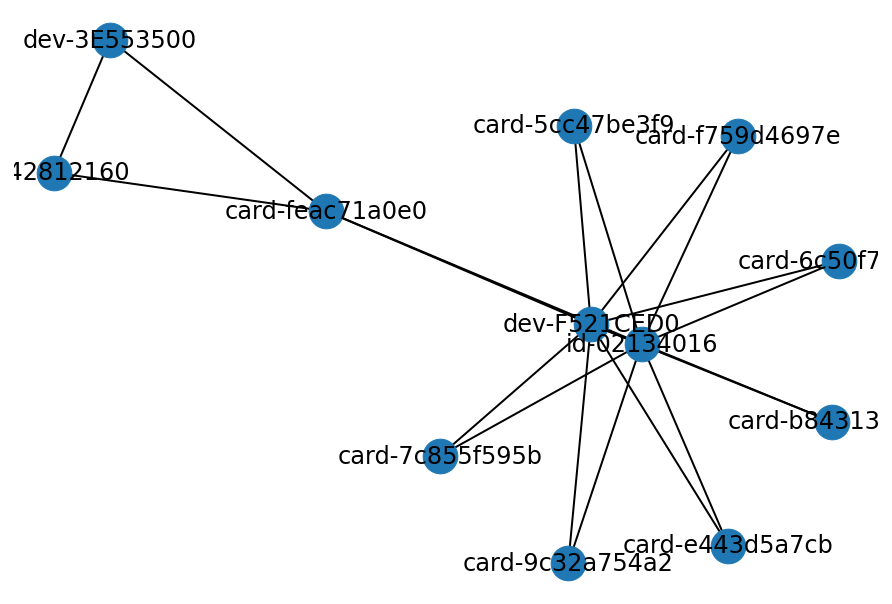

In [460]:
nx.draw(sub_listF[19], with_labels = True)

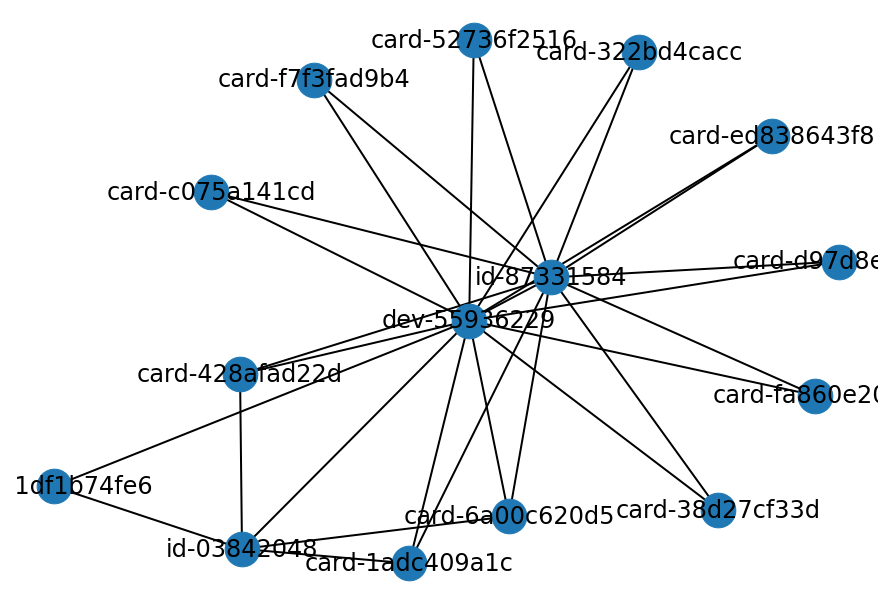

In [461]:
nx.draw(sub_listF[20], with_labels = True)

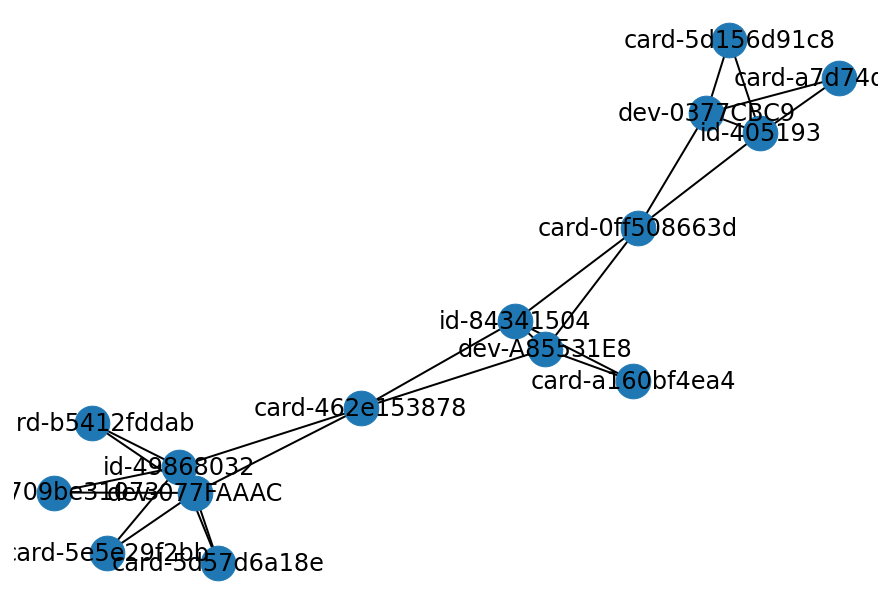

In [462]:
nx.draw(sub_listF[21], with_labels = True)

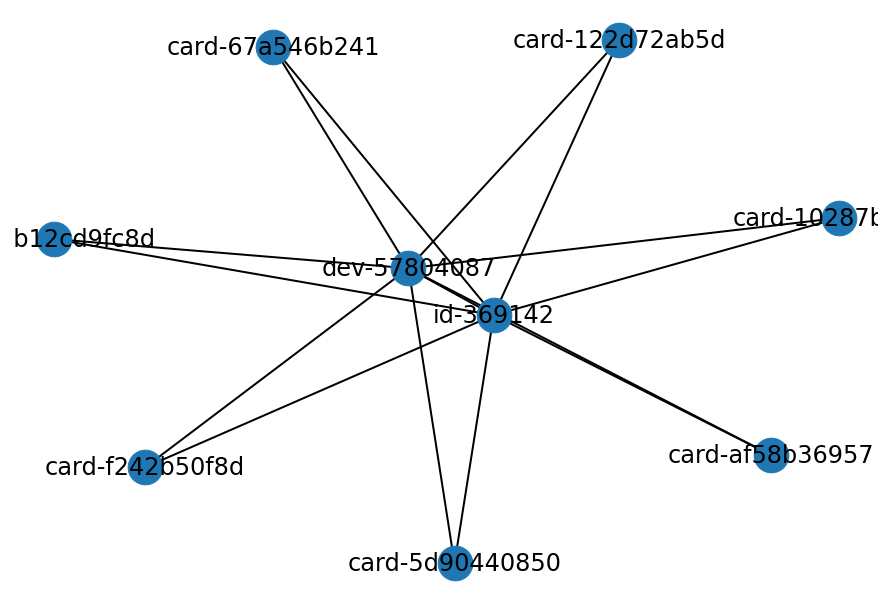

In [463]:
nx.draw(sub_listF[22], with_labels = True)

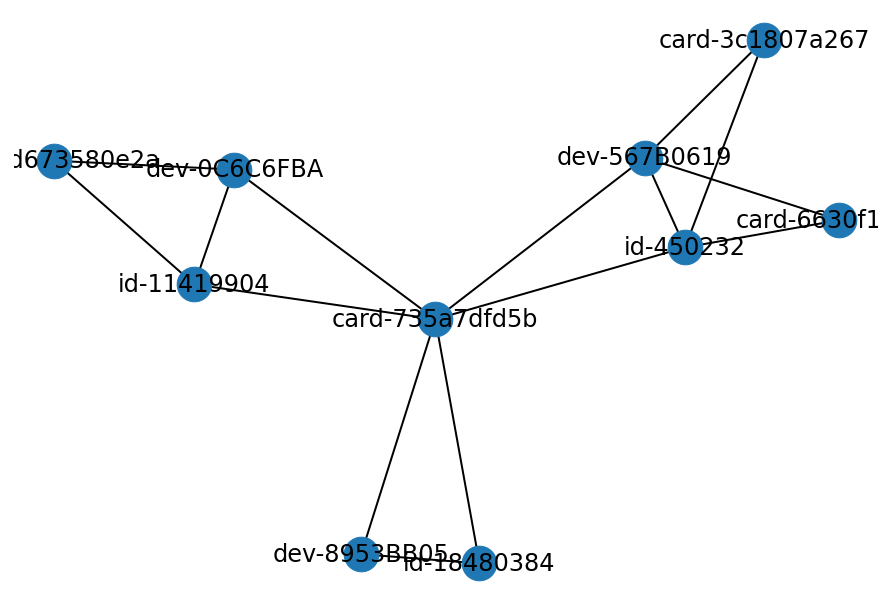

In [464]:
nx.draw(sub_listF[23], with_labels = True)

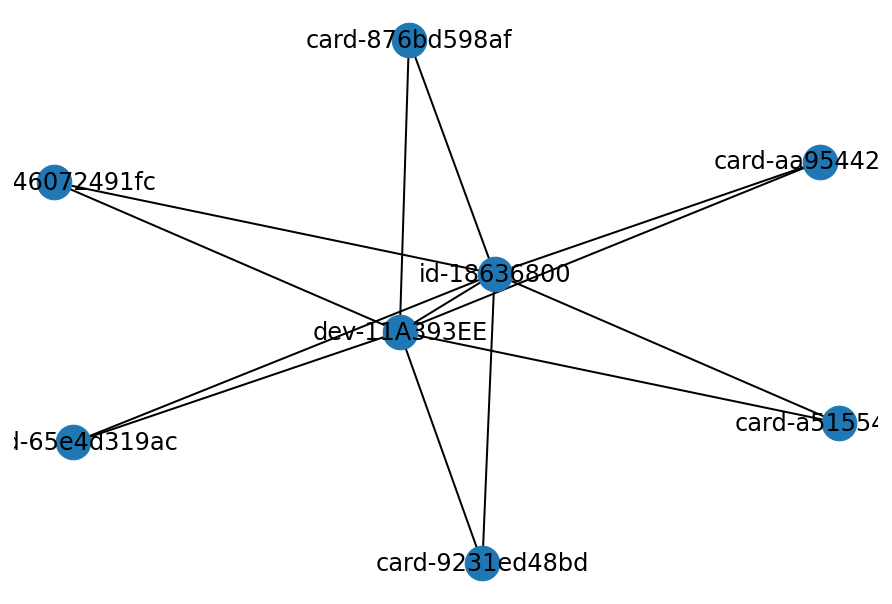

In [465]:
nx.draw(sub_listF[24], with_labels = True)

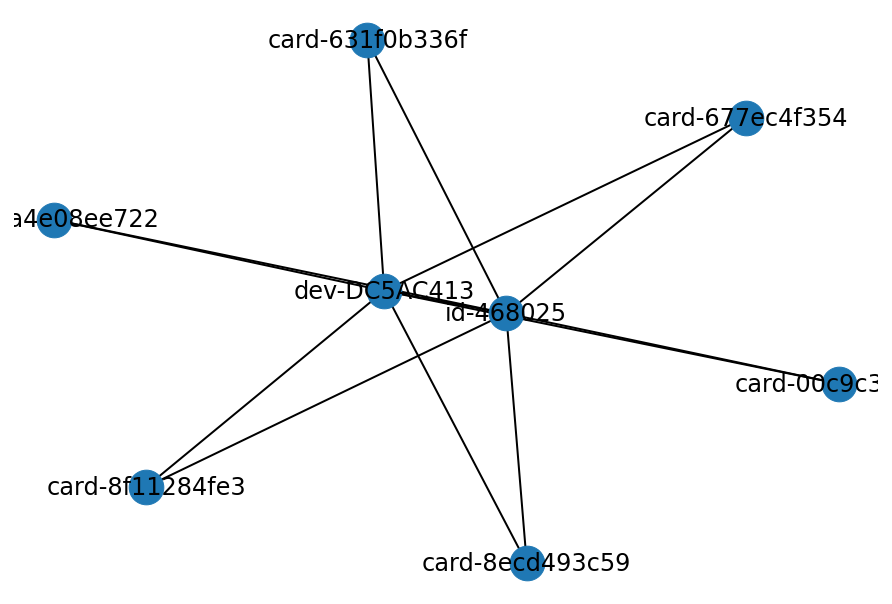

In [466]:
nx.draw(sub_listF[25], with_labels = True)

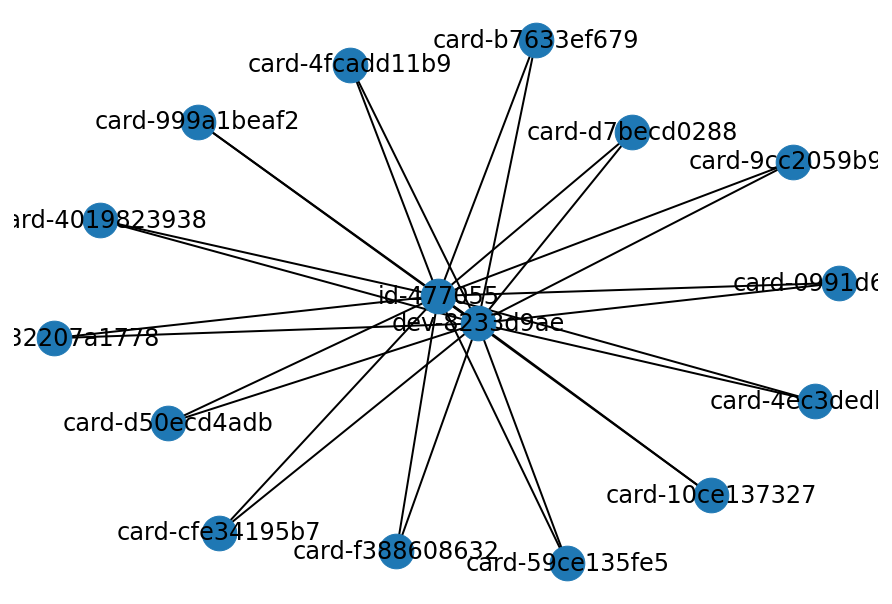

In [467]:
nx.draw(sub_listF[26], with_labels = True)

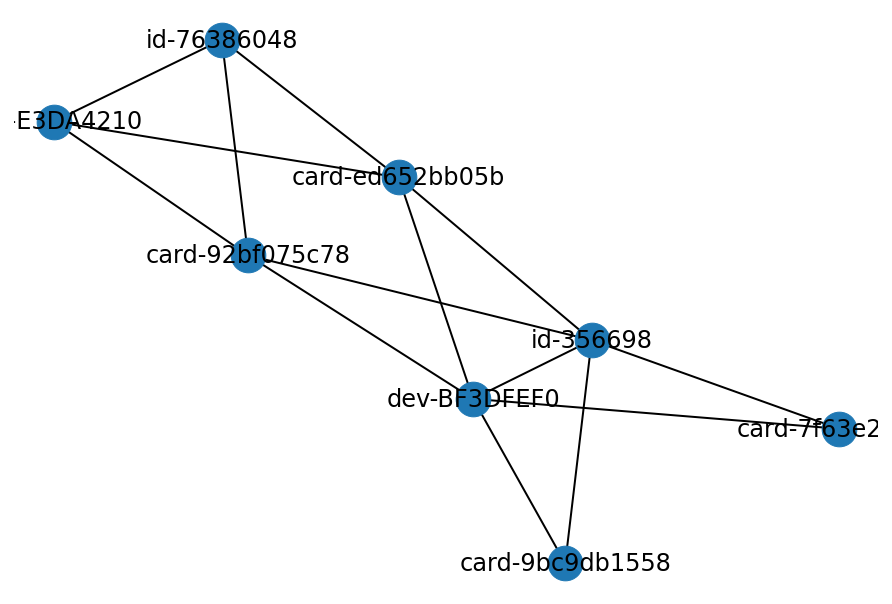

In [468]:
nx.draw(sub_listF[27], with_labels = True)

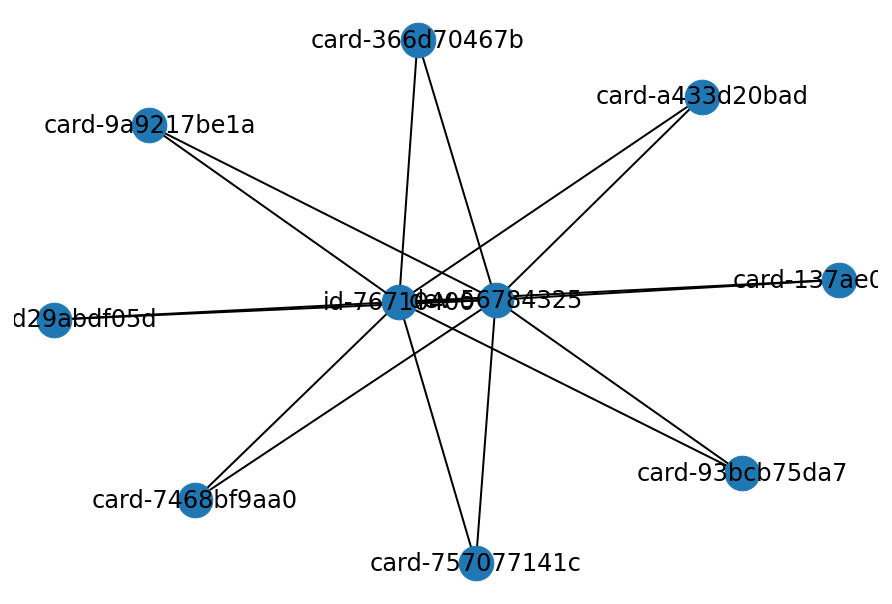

In [469]:
nx.draw(sub_listF[28], with_labels = True)

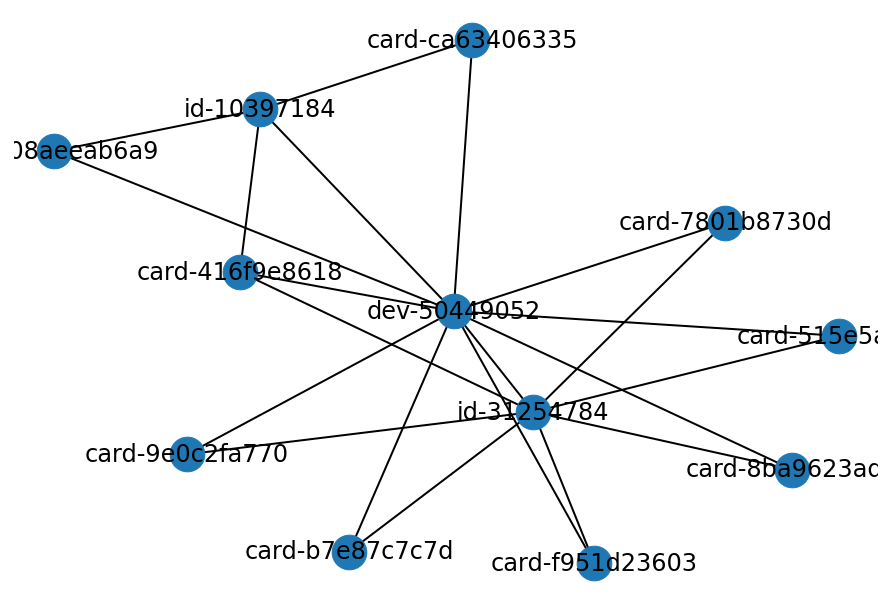

In [470]:
nx.draw(sub_listF[29], with_labels = True)

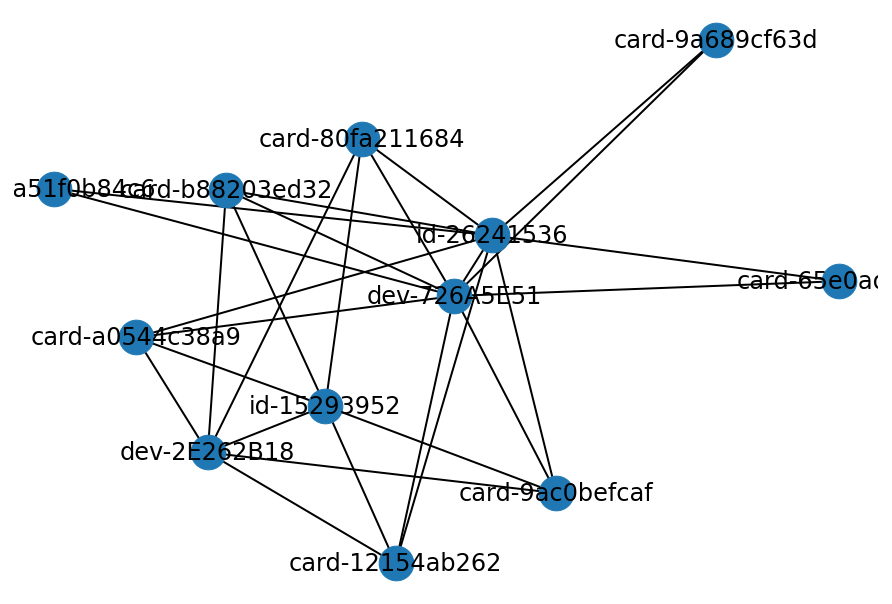

In [471]:
nx.draw(sub_listF[30], with_labels = True)

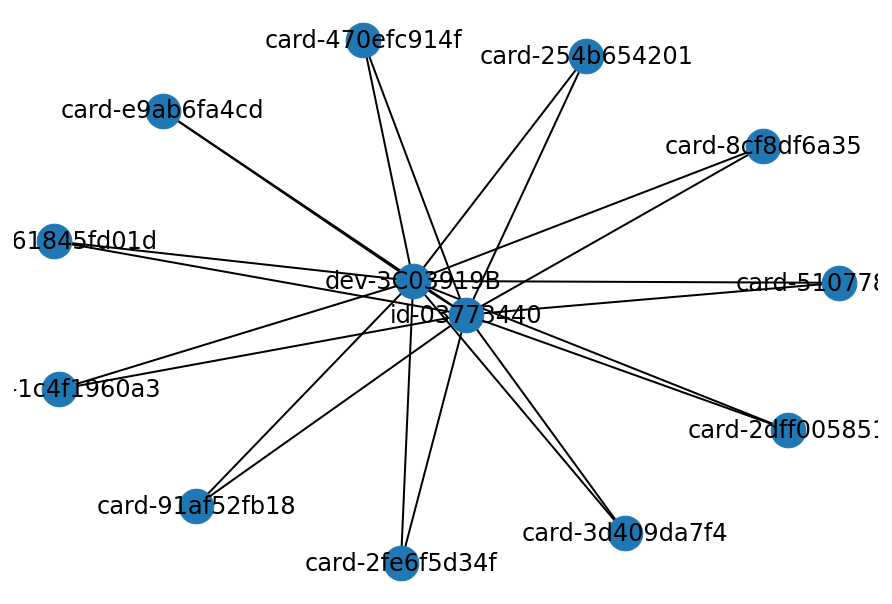

In [472]:
nx.draw(sub_listF[31], with_labels = True)

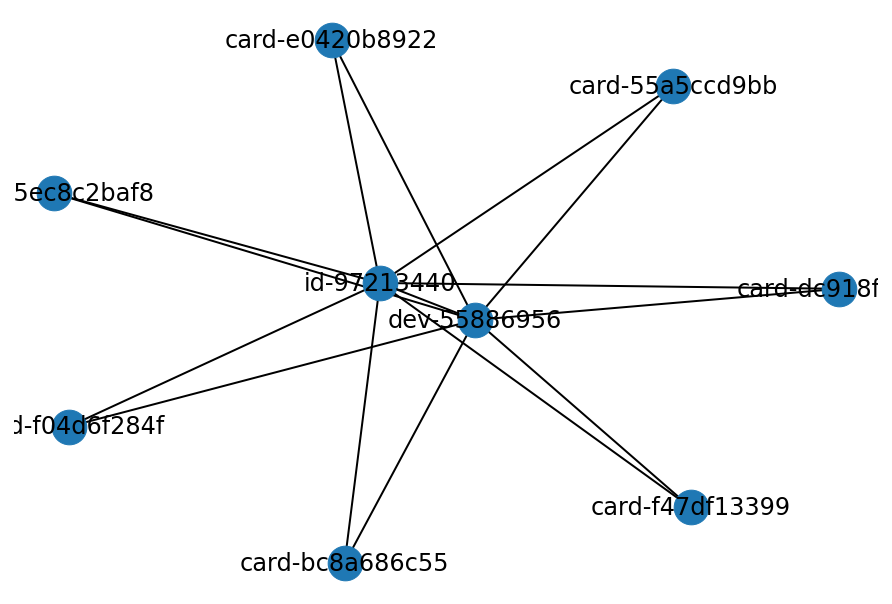

In [473]:
nx.draw(sub_listF[32], with_labels = True)

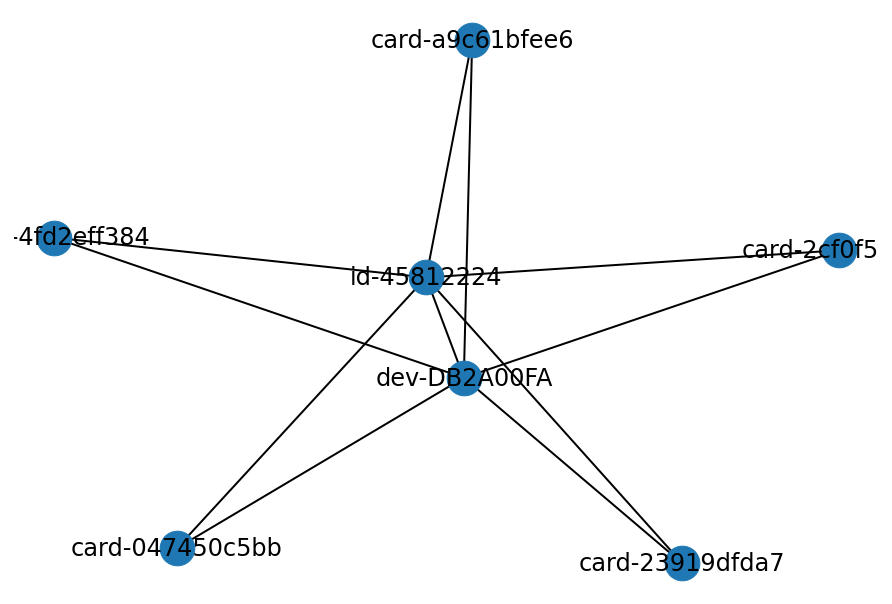

In [474]:
nx.draw(sub_listF[33], with_labels = True)

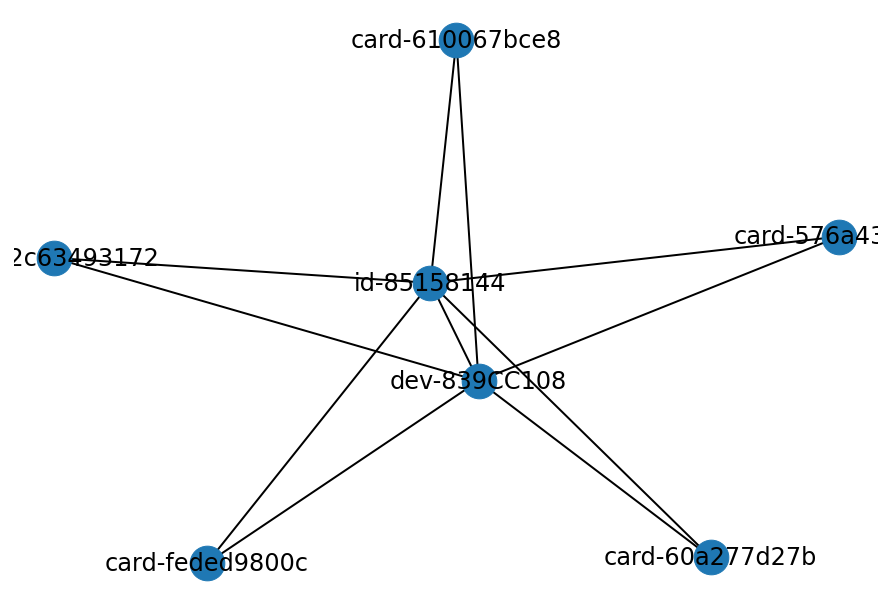

In [475]:
nx.draw(sub_listF[34], with_labels = True)

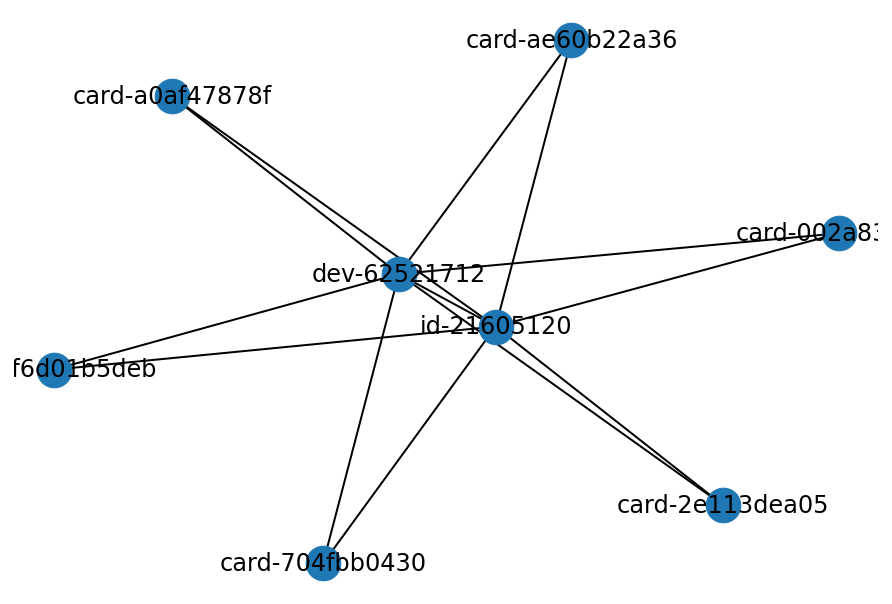

In [476]:
nx.draw(sub_listF[35], with_labels = True)

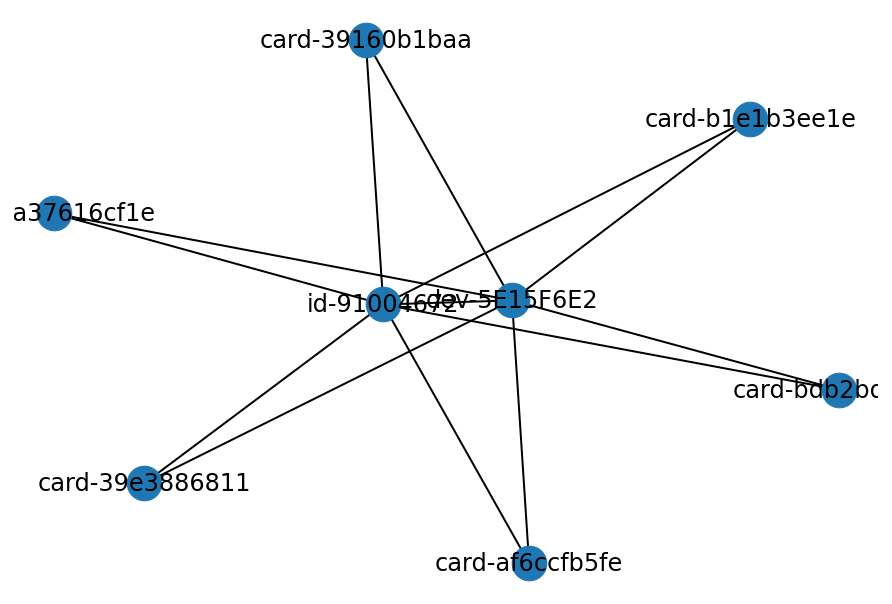

In [477]:
nx.draw(sub_listF[36], with_labels = True)

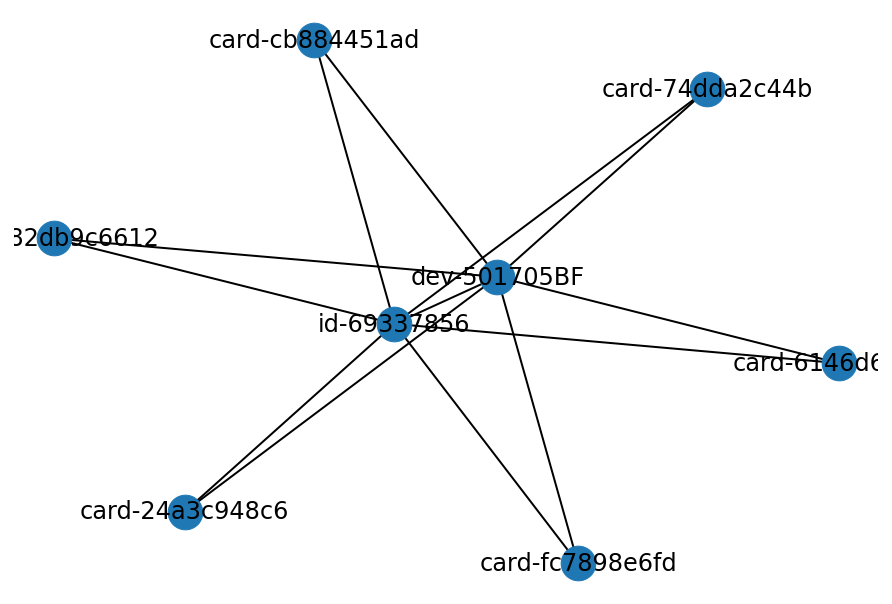

In [478]:
nx.draw(sub_listF[37], with_labels = True)

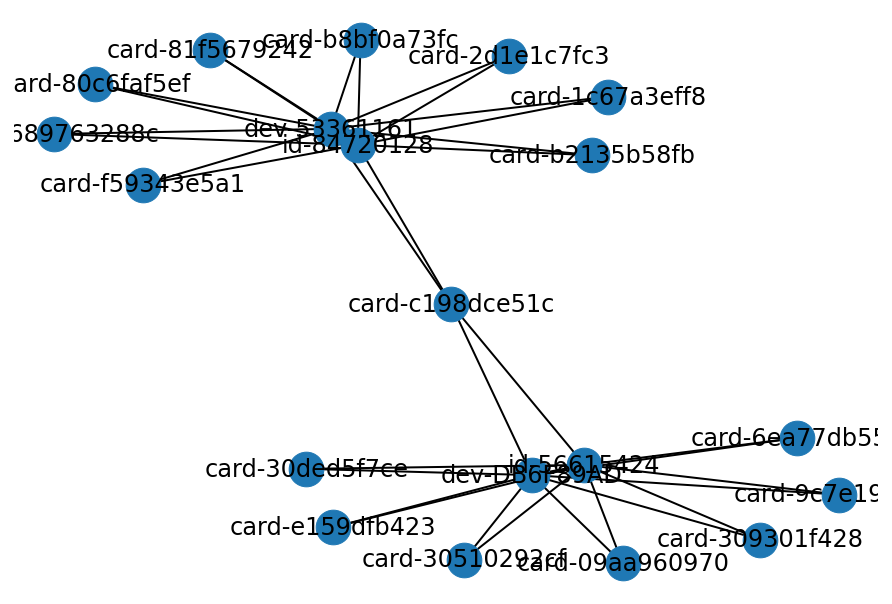

In [479]:
nx.draw(sub_listF[38], with_labels = True)

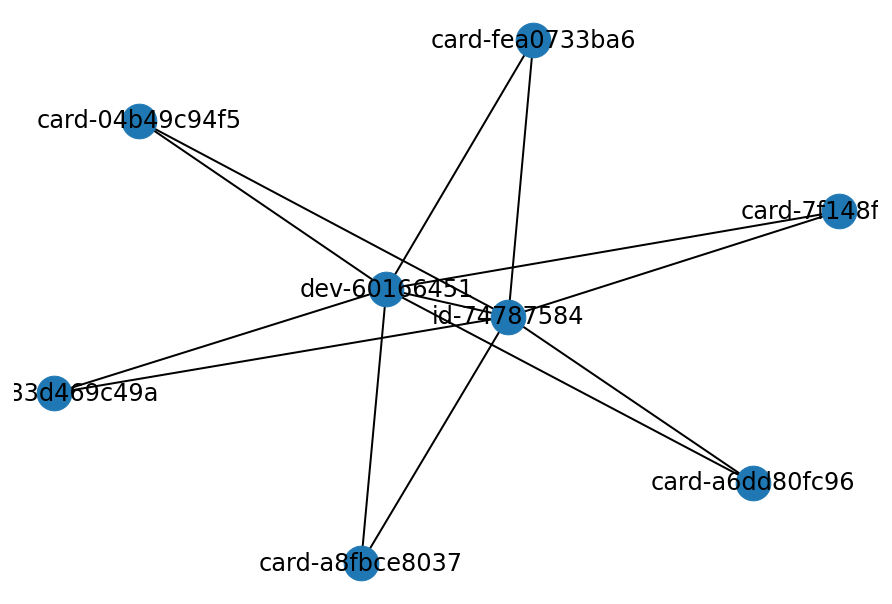

In [480]:
nx.draw(sub_listF[39], with_labels = True)

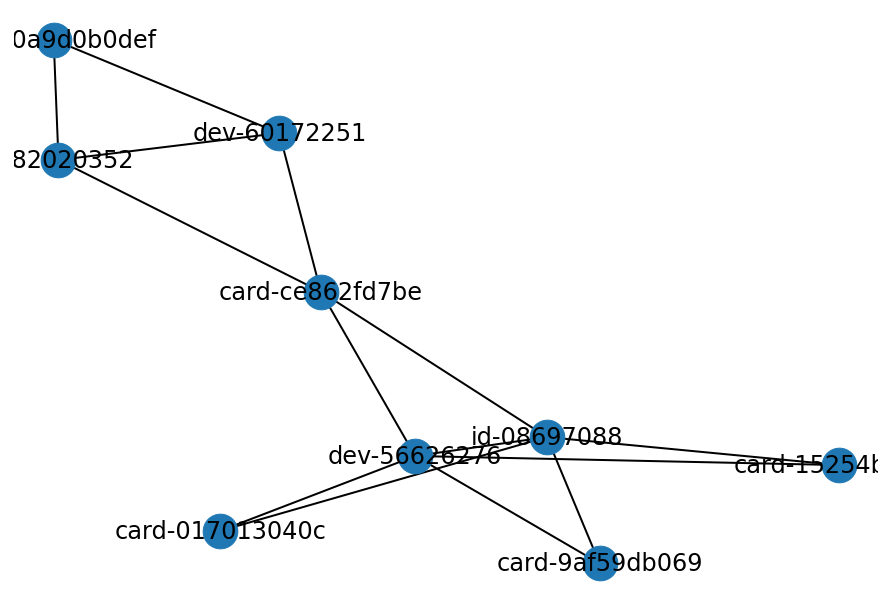

In [481]:
nx.draw(sub_listF[40], with_labels = True)

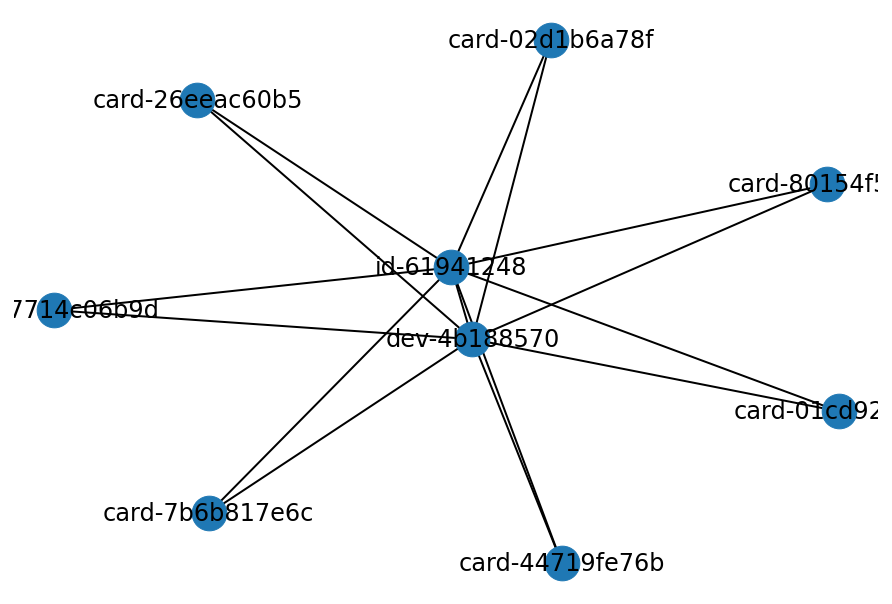

In [482]:
nx.draw(sub_listF[41], with_labels = True)

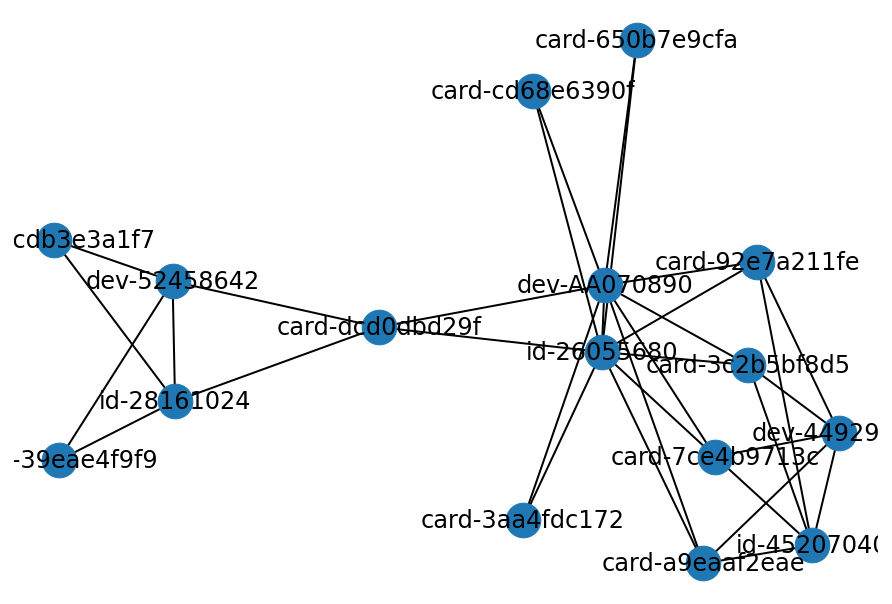

In [483]:
nx.draw(sub_listF[42], with_labels = True)

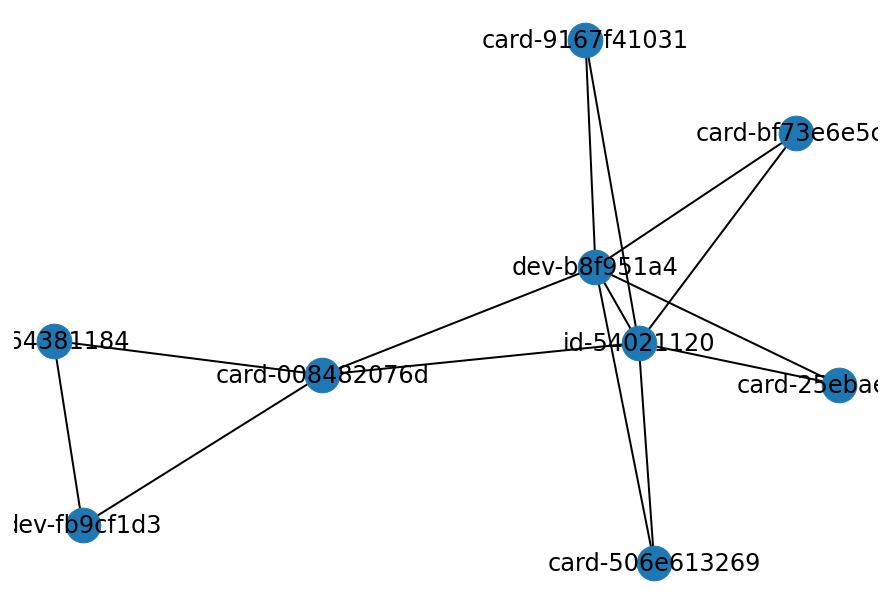

In [484]:
nx.draw(sub_listF[43], with_labels = True)

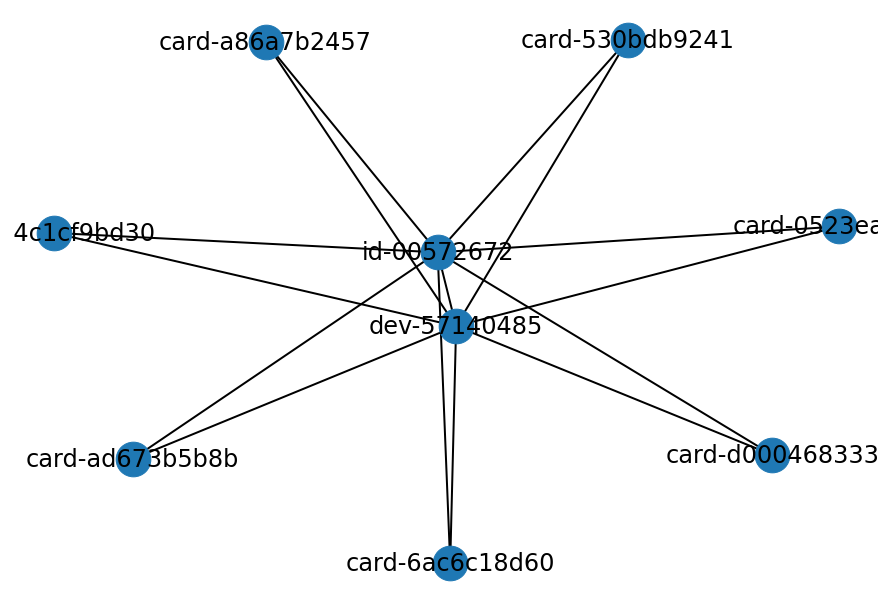

In [485]:
nx.draw(sub_listF[44], with_labels = True)